# Import Libraries

In [288]:
# Data Manipulation and Visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import statsmodels.api as sm

# For progress bars and faster processing
from tqdm import tqdm
import swifter

# Natural Language Processing (NLP) Libraries
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# Topic Modeling and Embeddings
from bertopic import BERTopic
from bertopic.representation import KeyBERTInspired, MaximalMarginalRelevance, PartOfSpeech
from sentence_transformers import SentenceTransformer
from keybert import KeyBERT

# Transformers and Gensim for Language Models
from transformers import AutoTokenizer, AutoModel, pipeline
from gensim.models import LdaModel, CoherenceModel
from gensim.corpora import Dictionary

# Vectorization and Embedding-based Techniques
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF

# For Dimensionality Reduction
from umap import UMAP
from sklearn.decomposition import PCA

# For Clustering
from hdbscan import HDBSCAN

# Machine Learning Models and Evaluation
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import RidgeClassifier, LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# PyTorch for Deep Learning
import torch
import torch.nn as nn
import torch.optim as optim

# WordCloud for Visualizing Word Frequencies
from wordcloud import WordCloud
from collections import Counter

# Data Loading

We are loading in the dataset that is labelled by the `sileod/deberta-v3-base-tasksource-toxicity` model. The model is primarily designed for detecting **toxicity** in online comments. However, it also extends to **hate speech**, as it was trained on datasets related to both **toxicity** and **hate speech**.

The labelled dataset is split into 5 files so we will be loading each of the 5 files.

In [ ]:
temp_1 = pd.read_csv("./data/deberta_v3_labelled_3_1.csv")
temp_2 = pd.read_csv("./data/deberta_v3_labelled_3_2.csv")
temp_3 = pd.read_csv("./data/deberta_v3_labelled_3_3.csv")
temp_4 = pd.read_csv("./data/deberta_v3_labelled_3_4.csv")
temp_5 = pd.read_csv("./data/deberta_v3_labelled_3_5.csv")

Concatenate all 5 files together and drop any duplicated rows in the dataset.

In [265]:
temp = pd.concat([temp_1, temp_2, temp_3, temp_4, temp_5]).reset_index(drop=True)
deberta = temp.drop_duplicates().reset_index(drop=True)

Sort the dataframe by `timestamp`.

In [266]:
deberta['timestamp'] = pd.to_datetime(deberta['timestamp'])
deberta = deberta.sort_values(by='timestamp', ascending=True).reset_index(drop=True)

# Exploratory Data Analysis

Plotting weekly count of Reddit comments for both hate and non-hate.

In [5]:
# Resample both datasets weekly without setting index
deberta_non_hate = deberta[deberta['BERT_2_hate'] == False].reset_index(drop=True)
deberta_hate = deberta[deberta['BERT_2_hate'] == True].reset_index(drop=True)
hate_weekly = deberta_hate.groupby(pd.Grouper(key='timestamp', freq='W')).size().reset_index(name='Hate_Count')
non_hate_weekly = deberta_non_hate.groupby(pd.Grouper(key='timestamp', freq='W')).size().reset_index(name='Non_Hate_Count')

# Merge the two dataframes on 'timestamp'
merged_data = pd.merge(hate_weekly, non_hate_weekly, on='timestamp', how='outer').fillna(0)

# Create a line plot using Plotly
fig = px.line(merged_data, x='timestamp', y=['Hate_Count', 'Non_Hate_Count'],
              title='Weekly Count of Reddit Comments (Hate vs Non-Hate)')

# Update layout for better readability
fig.update_layout(
    xaxis_title='Week',
    yaxis_title='Count',
    legend_title='Comment Type'
)

# Show the plot
fig.show()

Only plotting weekly count of hate comments on Reddit.

In [ ]:
fig = px.line(hate_weekly, x='timestamp', y='Hate_Count',
              title='Weekly Count of Hate Comments on Reddit')

fig.update_layout(
    xaxis_title='Week',
    yaxis_title='Count of Hate Comments',
    legend_title='Comment Type'
)

fig.show()

Plotting the weekly proportion of hate to non-hate comments with a trend line.

In [7]:
# Calculate the Hate to Non-Hate Ratio
merged_data['Hate_to_NonHate_Ratio'] = merged_data['Hate_Count'] / merged_data['Non_Hate_Count'].replace(0, 1)

# Remove any NaN values before fitting the trend line
trend_data = merged_data[['timestamp', 'Hate_to_NonHate_Ratio']].dropna()

# Convert timestamp to ordinal format for regression
trend_data['timestamp_ordinal'] = trend_data['timestamp'].apply(lambda x: x.toordinal())

# Fit a linear regression model
X = trend_data['timestamp_ordinal']
y = trend_data['Hate_to_NonHate_Ratio']
X = sm.add_constant(X)  # Adds a constant term to the predictor for linear regression
model = sm.OLS(y, X).fit()
trend_data['Trend_Line'] = model.predict(X)

# Create the plot with the original data and the trend line
fig = px.line(trend_data, x='timestamp', y='Hate_to_NonHate_Ratio',
              title='Weekly Proportion of Hate to Non-Hate Comments with Trend Line')
fig.add_scatter(x=trend_data['timestamp'], y=trend_data['Trend_Line'], mode='lines', name='Trend Line')

# Update layout for readability
fig.update_layout(
    xaxis_title='Week',
    yaxis_title='Ratio of Hate to Non-Hate Comments'
)

# Show the plot
fig.show()

Plotting the weekly proportion of hate to non-hate comments with a trend line up till 1 October 2023.

In [8]:
# Calculate the Hate to Non-Hate Ratio
merged_data['Hate_to_NonHate_Ratio'] = merged_data['Hate_Count'] / merged_data['Non_Hate_Count'].replace(0, 1)

# Filter out data from 1 October 2023 onwards
filtered_data = merged_data[merged_data['timestamp'] < '2023-10-01']

# Remove any NaN values before fitting the trend line
trend_data = filtered_data[['timestamp', 'Hate_to_NonHate_Ratio']].dropna()

# Convert timestamp to ordinal format for regression
trend_data['timestamp_ordinal'] = trend_data['timestamp'].apply(lambda x: x.toordinal())

# Fit a linear regression model
X = trend_data['timestamp_ordinal']
y = trend_data['Hate_to_NonHate_Ratio']
X = sm.add_constant(X)  # Adds a constant term to the predictor for linear regression
model = sm.OLS(y, X).fit()
trend_data['Trend_Line'] = model.predict(X)

# Create the plot with the original data and the trend line
fig = px.line(trend_data, x='timestamp', y='Hate_to_NonHate_Ratio',
              title='Weekly Proportion of Hate to Non-Hate Comments with Trend Line (Before October 1, 2023)')
fig.add_scatter(x=trend_data['timestamp'], y=trend_data['Trend_Line'], mode='lines', name='Trend Line')

# Update layout for readability
fig.update_layout(
    xaxis_title='Week',
    yaxis_title='Ratio of Hate to Non-Hate Comments'
)

# Show the plot
fig.show()

In [268]:
print(f"{round(((0.6056585-0.4795188)/0.4795188) * 100, 2)}% increase in weekly proportion of hate to non-hate comments from Jan 2020 to Sep 2023")

26.31% increase in weekly proportion of hate to non-hate comments from Jan 2020 to Sep 2023


# Data Preprocessing

## Data Cleaning

In [9]:
deberta_NaNs = deberta[deberta['text'].isna()].reset_index(drop=True)
deberta_cleaned = deberta[deberta['text'].notna()].reset_index(drop=True)

Checking for null values in the `text` column of the dataset.

In [10]:
deberta_NaNs

,text,timestamp,username,link,link_id,parent_id,id,subreddit_id,moderation,BERT_2_hate


## Natural Language Processing

Simple NLP techniques to process the `text` of the entire dataset.

In [11]:
# Download necessary NLTK data
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

# Initialize lemmatizer and stopwords
lemmatizer = WordNetLemmatizer()
stop_words = set(stopwords.words('english'))

def preprocess_nltk(text):
    tokens = [lemmatizer.lemmatize(token) for token in word_tokenize(text.lower()) if token.isalpha() and token not in stop_words]
    return ' '.join(tokens)

# Apply NLTK-based preprocessing to the text column in parallel
deberta_cleaned['nltk_processed_text'] = deberta_cleaned['text'].swifter.apply(preprocess_nltk)

[nltk_data] Downloading package punkt to /Users/glennwee/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/glennwee/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/glennwee/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Pandas Apply:   0%|          | 0/4504330 [00:00<?, ?it/s]

# Topic Modelling

1. LDA: A probabilistic model assigning topics as word mixtures, effective for interpretability in large datasets.
 
2. NMF: Decomposes term matrices to find latent topics, performing well with sparse data but less effective with nuanced language.

3. BERTopic: Combines transformer embeddings with clustering, capturing context well; ideal for short or informal texts.

Others:

- [Rapid Keyword Extraction (RAKE) Algorithm](https://www.analyticsvidhya.com/blog/2021/10/rapid-keyword-extraction-rake-algorithm-in-natural-language-processing/)

- [KeyBERT](https://maartengr.github.io/KeyBERT/api/keybert.html)

Splitting the dataset into hate and non-hate datasets.

In [12]:
deberta_cleaned_hate = deberta_cleaned[deberta_cleaned['BERT_2_hate'] == True].reset_index(drop=True)
deberta_cleaned_non_hate = deberta_cleaned[deberta_cleaned['BERT_2_hate'] == False].reset_index(drop=True)

In [13]:
len(deberta_cleaned_hate)

1573680

1.5 million comments labelled as toxic/hateful. Taking a subset for topic modelling experimentation.

In [14]:
def sample_monthly_data(df, n):
    # Convert 'timestamp' to datetime if it's not already
    df['timestamp'] = pd.to_datetime(df['timestamp'])
    
    # Filter for entries with at least 2 words in "text"
    df = df[df['text'].str.split().str.len() >= 2]
    
    # Group by year and month, then sample n data points from each group
    sampled_data = df.groupby([df['timestamp'].dt.year, df['timestamp'].dt.month]) \
                     .apply(lambda x: x.sample(n=min(len(x), n), random_state=4264)) \
                     .reset_index(drop=True)
    
    return sampled_data.sort_values("timestamp")

In [15]:
n = 5000  # Number of data points per month
sampled_hate = sample_monthly_data(deberta_cleaned_hate, n)

In [16]:
len(sampled_hate)

230000

## Latent Dirichlet Allocation (LDA)

Traditional probabilistic model for topic extraction.

In [44]:
texts_preprocessed = sampled_hate['nltk_processed_text'].tolist()

vectorizer = CountVectorizer(max_df=0.90, min_df=0.001, stop_words='english')
dtm = vectorizer.fit_transform(texts_preprocessed)

lda = LatentDirichletAllocation(n_components = 50, random_state = 4264)
lda.fit(dtm)

def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print(f"Topic {topic_idx}:")
        print(", ".join([feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]))

no_top_words = 10
tf_feature_names = vectorizer.get_feature_names_out()
display_topics(lda, tf_feature_names, no_top_words)

Topic 0:
person, girl, mental, guy, think, bad, health, uncle, boomer, fault
Topic 1:
gt, said, singapore, http, mr, code, source, contribute, police, tan
Topic 2:
kid, family, wife, parent, want, single, date, relationship, couple, brain
Topic 3:
day, time, week, hour, waste, work, morning, weekend, minute, night
Topic 4:
damn, yes, dont, sound, like, la, mean, good, fan, bruh
Topic 5:
http, game, article, read, video, website, play, thread, site, list
Topic 6:
help, really, time, learn, thing, good, experience, know, better, make
Topic 7:
went, wtf, victim, told, asked, boy, took, video, said, door
Topic 8:
comment, op, post, reply, discussion, attention, flag, note, button, mod
Topic 9:
leave, test, data, team, result, negative, positive, alcohol, picture, cock
Topic 10:
pap, party, vote, opposition, mp, wp, election, parliament, people, political
Topic 11:
fuck, bro, like, liao, yeah, chicken, rice, hot, taste, nah
Topic 12:
lol, shit, stupid, know, kena, smart, use, burn, lt, come

In [45]:
# Step 1: Create a Gensim Dictionary and Corpus
texts_tokenized = [text.split() for text in texts_preprocessed]
dictionary = Dictionary(texts_tokenized)
corpus = [dictionary.doc2bow(text) for text in texts_tokenized]

# Step 2: Get the topics from the LDA model
lda_topics = lda.components_
lda_topics_words = [[vectorizer.get_feature_names_out()[i] for i in topic.argsort()[:-10 - 1:-1]] for topic in lda_topics]

# Step 3: Calculate Coherence Score
coherence_model_lda = CoherenceModel(topics = lda_topics_words,
                                     texts = texts_tokenized,
                                     dictionary = dictionary,
                                     coherence = 'c_v')

coherence_lda = coherence_model_lda.get_coherence()
print(f'Coherence Score for LDA Model: {coherence_lda}')

Coherence Score for LDA Model: 0.5497047918107107


Calculating coherence scores over a range of number of topics for LDA.

In [46]:
n_topics_list = [10, 20, 30, 40, 50]
coherence_scores = []

for n_topics in tqdm(n_topics_list):
    lda = LatentDirichletAllocation(n_components = n_topics, random_state = 4264)
    lda.fit(dtm)
    lda_topics = lda.components_
    lda_topics_words = [[vectorizer.get_feature_names_out()[i] for i in topic.argsort()[:-10 - 1:-1]] for topic in lda_topics]    
    coherence_model_lda = CoherenceModel(topics = lda_topics_words, 
                                         texts = texts_tokenized, 
                                         dictionary = dictionary, 
                                         coherence = 'c_v')    
    coherence_lda = coherence_model_lda.get_coherence()
    print(f"Number of topics: {n_topics} | Coherence Score: {coherence_lda}")
    coherence_scores.append(coherence_lda)

 20%|██        | 1/5 [03:19<13:18, 199.51s/it]

Number of topics: 10 | Coherence Score: 0.5463543126438586


 40%|████      | 2/5 [06:30<09:42, 194.28s/it]

Number of topics: 20 | Coherence Score: 0.5665294342894885


 60%|██████    | 3/5 [09:43<06:27, 193.87s/it]

Number of topics: 30 | Coherence Score: 0.5688018546723135


 80%|████████  | 4/5 [13:44<03:32, 212.28s/it]

Number of topics: 40 | Coherence Score: 0.5665417735855582


100%|██████████| 5/5 [19:05<00:00, 229.17s/it]

Number of topics: 50 | Coherence Score: 0.5497047918107107


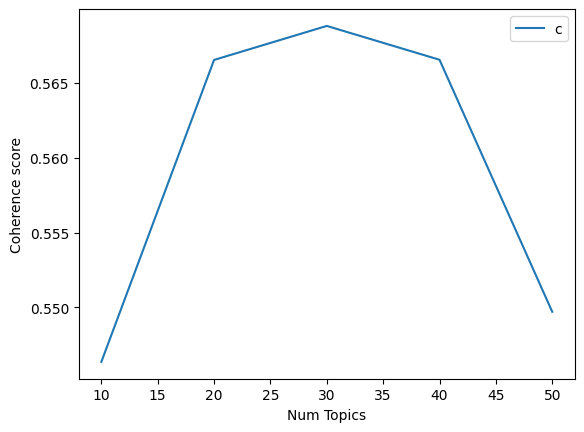

In [47]:
plt.plot(n_topics_list, coherence_scores)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

LDA with the number of topics with the highest coherence score.

In [48]:
lda = LatentDirichletAllocation(n_components = 30, random_state = 4264)
lda.fit(dtm)
no_top_words = 15
tf_feature_names = vectorizer.get_feature_names_out()
display_topics(lda, tf_feature_names, no_top_words)

Topic 0:
guy, girl, car, driver, bus, road, bad, im, boomer, uncle, driving, drive, leh, think, like
Topic 1:
gt, said, http, singapore, mr, code, source, contribute, year, added, advertisement, tan, public, lee, time
Topic 2:
kid, parent, child, family, sex, want, gay, wife, mother, relationship, date, marriage, baby, couple, age
Topic 3:
day, time, work, hour, week, home, night, sleep, office, leave, waste, long, morning, minute, went
Topic 4:
like, look, damn, dont, yes, sound, la, mean, word, good, thats, ok, say, know, think
Topic 5:
http, amp, article, post, link, news, read, message, google, data, fake, page, posted, send, info
Topic 6:
really, work, good, job, time, help, thing, better, know, need, feel, make, life, try, think
Topic 7:
man, police, video, wtf, victim, boy, doctor, scam, took, report, asked, told, photo, time, said
Topic 8:
comment, post, joke, op, discussion, question, action, face, ban, report, contact, subreddit, automatically, bot, concern
Topic 9:
lol, test

## Non-Negative Matrix Factorization (NMF)

Another technique that works well with document-term matrices.

In [49]:
# Vectorize the text using TF-IDF
tfidf_vectorizer = TfidfVectorizer(max_df=0.90, min_df=0.001, stop_words='english')
tfidf = tfidf_vectorizer.fit_transform(sampled_hate['nltk_processed_text'])

# Apply NMF
nmf_model = NMF(n_components=30, random_state=4264)
W = nmf_model.fit_transform(tfidf)
H = nmf_model.components_

# Print top terms in each topic
feature_names = tfidf_vectorizer.get_feature_names_out()
for topic_idx, topic in enumerate(H):
    print(f"Topic {topic_idx}: ", [feature_names[i] for i in topic.argsort()[:-11:-1]])

Topic 0:  ['thing', 'make', 'singapore', 'way', 'life', 'right', 'year', 'country', 'better', 'singaporean']
Topic 1:  ['gt', 'said', 'singapore', 'case', 'code', 'source', 'contribute', 'mr', 'advertisement', 'police']
Topic 2:  ['lol', 'hilarious', 'haha', 'actually', 'yeah', 'dude', 'thought', 'la', 'funny', 'saw']
Topic 3:  ['like', 'sound', 'feel', 'smell', 'taste', 'stuff', 'treat', 'haha', 'kind', 'act']
Topic 4:  ['http', 'amp', 'link', 'post', 'singapore', 'info', 'hour', 'page', 'video', 'delete']
Topic 5:  ['people', 'rich', 'mask', 'lot', 'stupid', 'group', 'hate', 'old', 'gay', 'kind']
Topic 6:  ['fuck', 'la', 'yeah', 'shut', 'wrong', 'eh', 'pap', 'lah', 'holy', 'dumb']
Topic 7:  ['shit', 'holy', 'piece', 'eat', 'stir', 'talk', 'hit', 'ca', 'fan', 'happens']
Topic 8:  ['got', 'ta', 'friend', 'meh', 'dude', 'caught', 'maybe', 'covid', 'went', 'year']
Topic 9:  ['comment', 'post', 'discussion', 'joke', 'bot', 'moderator', 'subreddit', 'question', 'removed', 'automatically']


## BERTopic

More advanced, utilizing transformer embeddings (e.g., BERT) and clustering algorithms to create topics. BERTopic produces coherent topics and is easier to integrate with embeddings. Using embeddings with BERTopic, it relies on hierarchical clustering, so we don't have to set any number of topics as a hyperparameter.

References:

1. [BERTopic: topic modeling as you have never seen it before](https://medium.com/data-reply-it-datatech/bertopic-topic-modeling-as-you-have-never-seen-it-before-abb48bbab2b2)

2. [Advanced Topic Modeling with BERTopic](https://www.pinecone.io/learn/bertopic/)

Running a simple BERTopic model without extensive tuning to assess the quality of the topic modelling.

In [13]:
# Create BERTopic model
topic_model = BERTopic(calculate_probabilities=False)

# Fit the model
topics, probabilities = topic_model.fit_transform(sampled_hate['nltk_processed_text'])

# View topics
topics_overview = topic_model.get_topic_info()

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISMTOKENIZERS_PARALL

Topic modelling by BERTopic is better and more interpretable than that of LDA and NMF. Although without tuning, a lot of micro-clusters/topics is present.

In [14]:
topics_overview

,Topic,Count,Name,Representation,Representative_Docs
0,-1,99784,-1_work_job_even_country,"[work, job, even, country, kid, thing, school,...",[anyways im free might well fun one thing said...
1,0,3912,0_onwards_he_username_blah,"[onwards, he, username, blah, official, , , , , ]","[, , he]"
2,1,1327,1_mask_wear_wearing_surgical,"[mask, wear, wearing, surgical, cloth, outdoor...","[time wear mask, wear mask, mask]"
3,2,1242,2_singaporean_singapore_ashamed_foreigner,"[singaporean, singapore, ashamed, foreigner, s...","[singaporean, singaporean, singapore singaporean]"
4,3,1099,3_drug_weed_cannabis_marijuana,"[drug, weed, cannabis, marijuana, trafficker, ...","[look like drug, drug, drug good]"
...,...,...,...,...,...
2475,2474,10,2474_oink_flag_zei_chabor,"[oink, flag, zei, chabor, recited, vandal, haw...",[singapore another flag convenience people use...
2476,2475,10,2475_rider_grabbing_pmd_degrades,"[rider, grabbing, pmd, degrades, rammed, caned...",[u think woman whack rider reason cuz rider ra...
2477,2476,10,2476_millionaire_luna_boohoo_slum,"[millionaire, luna, boohoo, slum, alrdy, tempo...","[also depressed millionaire, actually milliona..."
2478,2477,10,2477_sinocentric_lusting_qanon_colonized,"[sinocentric, lusting, qanon, colonized, hispa...",[surprised investigated dude insulted u first ...


In [15]:
topics_overview.iloc[:40]

,Topic,Count,Name,Representation,Representative_Docs
0,-1,99784,-1_work_job_even_country,"[work, job, even, country, kid, thing, school,...",[anyways im free might well fun one thing said...
1,0,3912,0_onwards_he_username_blah,"[onwards, he, username, blah, official, , , , , ]","[, , he]"
2,1,1327,1_mask_wear_wearing_surgical,"[mask, wear, wearing, surgical, cloth, outdoor...","[time wear mask, wear mask, mask]"
3,2,1242,2_singaporean_singapore_ashamed_foreigner,"[singaporean, singapore, ashamed, foreigner, s...","[singaporean, singaporean, singapore singaporean]"
4,3,1099,3_drug_weed_cannabis_marijuana,"[drug, weed, cannabis, marijuana, trafficker, ...","[look like drug, drug, drug good]"
5,4,1081,4_gay_lgbt_lgbtq_marriage,"[gay, lgbt, lgbtq, marriage, homosexual, strai...","[gay, gay, gay]"
6,5,973,5_gender_equality_men_woman,"[gender, equality, men, woman, feminist, femin...",[adding redditor comment two component need eq...
7,6,942,6_church_christian_bible_god,"[church, christian, bible, god, religion, cath...","[church gay people, church use reason, gt reme..."
8,7,916,7_racist_racism_race_minority,"[racist, racism, race, minority, racial, color...","[racist, racist, racist]"
9,8,897,8_sleep_sleeping_wake_asleep,"[sleep, sleeping, wake, asleep, nap, slept, wo...","[sleep, sleep, sleep]"


In [16]:
# Create a DataFrame with the original text and their corresponding topic labels
df_topics = pd.DataFrame({
    'text': sampled_hate['text'],
    'topic': topics
})

# Group the DataFrame by topics
grouped_topics = df_topics.groupby('topic')

# Function to display all text for a given topic
def get_text_for_topic(topic_number):
    topic_texts = grouped_topics.get_group(topic_number)['text']
    return topic_texts

In [18]:
# Get all texts for topic_id
topic_id = 4
topic_texts = get_text_for_topic(topic_id)

# Display topic_id texts
for i, text in enumerate(topic_texts, 1):
    print(f"Document {i}: {text}\n")

Document 1: Slightly unrelated, but this reminded me:

~~If I remember correctly, in an interview from 2007(?) LKY said that he would have supported repealing 377A if he was still the PM.~~

Nevermind, from the article itself:

&gt; He wrote: “(Lee Kuan Yew) said explicitly he thought homosexuality should not be criminalised because he believed it was genetically determined.”

&gt;The late Mr Lee also had two “don’ts” when it came to the law – the first was to not change the law because it will upset the “sense of propriety and right and wrong” of the majority; and the second was to not “go around like this moral police — barging into people’s rooms.”

Document 2: &gt;don't have dysfunctional lives

&gt;&gt;A particular group of people

*"LGBTQ all have dysfunctional lives!"*   
 \**waving printed copies of various *studies***

Document 3: what r ur thoughts abt lgbt?? im so grateful my family (external included) accepts me and my partner but im kinda freaking out as to how the public 

In [21]:
# Review representative documents for a specific topic 
topic_id = 4
docs = topic_model.get_representative_docs(topic_id)
for doc in docs:
    print(f"Representative doc for Topic {topic_id}: {doc}\n")

Representative doc for Topic 4: gay

Representative doc for Topic 4: gay

Representative doc for Topic 4: gay



In [ ]:
# Get the top words for each topic
for topic_id in topics_overview['Topic']:
    words = topic_model.get_topic(topic_id)
    print(f"Topic {topic_id}: {', '.join([word for word, _ in words])}")

Topic -1: work, job, even, country, kid, thing, school, government, would, people
Topic 0: onwards, he, username, blah, official, , , , , 
Topic 1: mask, wear, wearing, surgical, cloth, outdoors, droplet, respirator, worn, wearer
Topic 2: singaporean, singapore, ashamed, foreigner, sub, proud, country, cringe, singaporeraw, subreddit
Topic 3: drug, weed, cannabis, marijuana, trafficker, addict, trafficking, addiction, alcohol, heroin
Topic 4: gay, lgbt, lgbtq, marriage, homosexual, straight, heterosexual, repeal, sexuality, homosexuality
Topic 5: gender, equality, men, woman, feminist, feminism, sexist, masculinity, female, male
Topic 6: church, christian, bible, god, religion, catholic, christianity, sin, atheist, protestant
Topic 7: racist, racism, race, minority, racial, color, remark, casual, white, stereotype
Topic 8: sleep, sleeping, wake, asleep, nap, slept, woke, awake, sleepy, waking
Topic 9: vaccine, vaccinated, unvaccinated, vaccination, mrna, immunity, pfizer, vaccinate, ef

## Improving BERTopic

References:

1. [BERTopic: Representation Models](https://maartengr.github.io/BERTopic/getting_started/representation/representation.html)

2. [BERTopic: Modularity](https://maartengr.github.io/BERTopic/index.html#modularity)

3. [OCTIS : Optimizing and Comparing Topic Models is Simple!](https://github.com/MIND-Lab/OCTIS#available-metrics)

4. [BERTopic: Best Practices](https://maartengr.github.io/BERTopic/getting_started/best_practices/best_practices.html)

5. [BERTopic: Multiple Representations](https://maartengr.github.io/BERTopic/getting_started/multiaspect/multiaspect.html)

6. [BERTopic: Visualization](https://maartengr.github.io/BERTopic/getting_started/visualization/visualization.html)

7. [BERTopic: Hyperpameter Tuning](https://maartengr.github.io/BERTopic/getting_started/parameter%20tuning/parametertuning.html)

8. [BERTopic](https://maartengr.github.io/BERTopic/index.html)

### Further Cleaning

Preprocessing is generally unnecessary for document embeddings, especially in BERTopic, as every part aids in understanding the topic. However, outlier texts like the ones shown below will be removed as they seem to be mostly unhelpful in topic modelling.

In [17]:
sampled_hate[sampled_hate['nltk_processed_text'] == ''].head()

,text,timestamp,username,link,link_id,parent_id,id,subreddit_id,moderation,BERT_2_hate,nltk_processed_text
90,Me :*,2020-01-01 09:05:15,[deleted],/r/singapore/comments/ei9klf/rsingapore_random...,t3_ei9klf,t1_fcponb3,fcppsq7,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,
2316,~~New puppet~~,2020-01-10 02:50:18,bilbolaggings,/r/singapore/comments/emillt/singapore_muslims...,t3_emillt,t3_emillt,fdpbou7,t5_2qh8c,"{'removal_reason': None, 'collapsed': True, 'c...",True,
1729,no\n\n:(,2020-01-14 01:51:09,beetlemagnet,/r/singapore/comments/eob7vx/rsingapore_random...,t3_eob7vx,t1_febqir2,fec4u7l,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,
21,(╯°□°）╯︵ ┻━┻,2020-01-14 03:17:01,Rodneythekid,/r/singapore/comments/eob7vx/rsingapore_random...,t3_eob7vx,t1_fec91yr,fece8i3,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,
4363,( ͡° ͜ʖ ͡°),2020-01-15 02:41:10,Roshbers,/r/singapore/comments/eom1a2/what_are_the_comm...,t3_eom1a2,t3_eom1a2,fefgwcf,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,


In [18]:
sampled_hate_cleaned = sampled_hate[sampled_hate['nltk_processed_text'] != '']

### Fine-Tuning BERTopic

Fine-tune topics with representation models & multiple representations:

1. KeyBERTInspired: Useful for short texts or cases where keywords alone can provide meaningful topic representations. This approach identifies the most representative keywords, making it good for simple, keyword-focused topic extraction.

2. PartOfSpeech: Helpful if your dataset requires part-of-speech tagging to enhance topic coherence, as it can focus on nouns or other informative parts of speech. This is beneficial when topics are better represented by certain word types (e.g., nouns in legal or technical documents).

3. MaximalMarginalRelevance (MMR): Balances relevance and diversity in topic words, avoiding redundancy. Ideal if you need topics with a wider range of distinctive keywords, ensuring varied yet relevant terms within each topic.

4. Zero-Shot Classification: Works well when you have predefined categories or want to leverage large, pre-trained models to identify topics without labeled data. It’s suitable for labeling texts with known topics, but less flexible for exploratory topic modeling.

5. Chain Models: Designed for more complex, structured texts, allowing sequential dependencies to be captured. This is effective if the document context involves sequences (e.g., conversations or procedural documents) and enhances coherence for structured topics.

6. Custom Model: Offers flexibility if you need a highly specific model tailored to your dataset, such as using embeddings from a particular transformer or fine-tuning for domain-specific language.

Pre-calculate embeddings to save time, especially when iterating over parameters. BERTopic requires document embeddings, which can be costly to compute.

In [19]:
sampled_hate_cleaned = sampled_hate_cleaned.reset_index(drop=True)

In [20]:
# Pre-calculate embeddings
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = embedding_model.encode(sampled_hate_cleaned['text'], show_progress_bar=True)

Batches:   0%|          | 0/7168 [00:00<?, ?it/s]

**Experimenting with different hyperparameters**

| Row | `umap_n_neighbors` | `umap_min_dist` | `umap_n_components` | `hdbscan_min_cluster_size` | `hdbscan_min_samples` |
|------|---------------------|-----------------|----------------------|----------------------------|------------------------|
| 1    | 15                 | 0.1             | 5                    | 200                        | 1                      |
| 2    | 15                 | 0.1             | 5                    | 200                        | 5                      |
| 3    | 15                 | 0.1             | 5                    | 300                        | 1                      |
| 4    | 15                 | 0.1             | 5                    | 300                        | 5                      |
| 5    | 15                 | 0.3             | 5                    | 200                        | 1                      |
| 6    | 15                 | 0.3             | 5                    | 200                        | 5                      |
| 7    | 15                 | 0.3             | 5                    | 300                        | 1                      |
| 8    | 15                 | 0.3             | 5                    | 300                        | 5                      |
| 9    | 25                 | 0.1             | 5                    | 200                        | 1                      |
| 10   | 25                 | 0.1             | 5                    | 200                        | 5                      |
| 11   | 25                 | 0.1             | 5                    | 300                        | 1                      |
| 12   | 25                 | 0.1             | 5                    | 300                        | 5                      |
| 13   | 25                 | 0.3             | 5                    | 200                        | 1                      |
| 14   | 25                 | 0.3             | 5                    | 200                        | 5                      |
| 15   | 25                 | 0.3             | 5                    | 300                        | 1                      |
| 16   | 25                 | 0.3             | 5                    | 300                        | 5                      |

**Explanation of Each Set**

| Row | Description |
|------|-------------|
| **1–4** | `umap_n_neighbors=15`, `umap_min_dist=0.1`: These configurations create compact, highly localized clusters with `n_neighbors` set to a lower value and `min_dist` set to 0.1. By varying `hdbscan_min_cluster_size` and `hdbscan_min_samples`, we can explore both fine-grained and strict clustering (with `min_samples=5`) and looser, small clusters (with `min_samples=1`). |
| **5–8** | `umap_n_neighbors=15`, `umap_min_dist=0.3`: These configurations test how increasing the minimum distance in UMAP affects cluster compactness for a smaller neighborhood size. The larger `min_dist` creates slightly looser clusters, allowing for more spread. Varying `min_cluster_size` and `min_samples` again tests the balance between fine-grained clusters and broader groupings. |
| **9–12** | `umap_n_neighbors=25`, `umap_min_dist=0.1`: With a higher `n_neighbors`, these configurations capture more global structure, creating broader clusters with compact boundaries (`min_dist=0.1`). By adjusting `min_cluster_size` and `min_samples`, we test for both strict (larger `min_samples` and `min_cluster_size`) and flexible clustering (smaller values). |
| **13–16** | `umap_n_neighbors=25`, `umap_min_dist=0.3`: These configurations use both a high `n_neighbors` and a larger `min_dist`, allowing for broad clusters with looser boundaries. This setup captures large-scale structure, which may be suitable for finding broader topics. Adjustments to `min_cluster_size` and `min_samples` ensure we capture both robust clusters (higher values) and more flexible clusters (lower values). |

**Summary of Rationale**

This layout covers a range of parameter combinations that balances between:
- **Local and global structures** (`umap_n_neighbors`).
- **Compact and loose clusters** (`umap_min_dist`).
- **Fine-grained and broad clustering** (`hdbscan_min_cluster_size` and `hdbscan_min_samples`).

By systematically varying these combinations, this setup allows exploration of both small, detailed clusters and larger, overarching topics, providing a balanced search space for a range of clustering behaviors.

In [33]:
# Define 16 specific sets of parameter combinations
parameter_sets = [
    {"umap_n_neighbors": 15, "umap_min_dist": 0.1, "umap_n_components": 5, "hdbscan_min_cluster_size": 200, "hdbscan_min_samples": 1},
    {"umap_n_neighbors": 15, "umap_min_dist": 0.1, "umap_n_components": 5, "hdbscan_min_cluster_size": 200, "hdbscan_min_samples": 5},
    {"umap_n_neighbors": 15, "umap_min_dist": 0.1, "umap_n_components": 5, "hdbscan_min_cluster_size": 300, "hdbscan_min_samples": 1},
    {"umap_n_neighbors": 15, "umap_min_dist": 0.1, "umap_n_components": 5, "hdbscan_min_cluster_size": 300, "hdbscan_min_samples": 5},
    {"umap_n_neighbors": 15, "umap_min_dist": 0.3, "umap_n_components": 5, "hdbscan_min_cluster_size": 200, "hdbscan_min_samples": 1},
    {"umap_n_neighbors": 15, "umap_min_dist": 0.3, "umap_n_components": 5, "hdbscan_min_cluster_size": 200, "hdbscan_min_samples": 5},
    {"umap_n_neighbors": 15, "umap_min_dist": 0.3, "umap_n_components": 5, "hdbscan_min_cluster_size": 300, "hdbscan_min_samples": 1},
    {"umap_n_neighbors": 15, "umap_min_dist": 0.3, "umap_n_components": 5, "hdbscan_min_cluster_size": 300, "hdbscan_min_samples": 5},
    {"umap_n_neighbors": 25, "umap_min_dist": 0.1, "umap_n_components": 5, "hdbscan_min_cluster_size": 200, "hdbscan_min_samples": 1},
    {"umap_n_neighbors": 25, "umap_min_dist": 0.1, "umap_n_components": 5, "hdbscan_min_cluster_size": 200, "hdbscan_min_samples": 5},
    {"umap_n_neighbors": 25, "umap_min_dist": 0.1, "umap_n_components": 5, "hdbscan_min_cluster_size": 300, "hdbscan_min_samples": 1},
    {"umap_n_neighbors": 25, "umap_min_dist": 0.1, "umap_n_components": 5, "hdbscan_min_cluster_size": 300, "hdbscan_min_samples": 5},
    {"umap_n_neighbors": 25, "umap_min_dist": 0.3, "umap_n_components": 5, "hdbscan_min_cluster_size": 200, "hdbscan_min_samples": 1},
    {"umap_n_neighbors": 25, "umap_min_dist": 0.3, "umap_n_components": 5, "hdbscan_min_cluster_size": 200, "hdbscan_min_samples": 5},
    {"umap_n_neighbors": 25, "umap_min_dist": 0.3, "umap_n_components": 5, "hdbscan_min_cluster_size": 300, "hdbscan_min_samples": 1},
    {"umap_n_neighbors": 25, "umap_min_dist": 0.3, "umap_n_components": 5, "hdbscan_min_cluster_size": 300, "hdbscan_min_samples": 5},
]

# Define all representation models
representation_models = {
    "Main": None,  # BERTopic's default topic representation
    "KeyBERT": KeyBERTInspired(),
    "POS": PartOfSpeech("en_core_web_sm"),
    "KeyBERT_MMR": [KeyBERTInspired(), MaximalMarginalRelevance(diversity=0.5)],
}

# Store results
results = []

# Define helper function to calculate coherence for a given representation
def calculate_coherence(topic_model, texts, representation_name):
    # Get topic words for the specified representation
    topic_words = [
        [word for word, _ in topic_model.get_topic(topic, full=True).get(representation_name)]
        for topic in topic_model.get_topics().keys() if topic != -1
    ]
    
    # Tokenize texts for coherence model
    tokenized_texts = [text.split() for text in texts]
    dictionary = Dictionary(tokenized_texts)
    corpus = [dictionary.doc2bow(text) for text in tokenized_texts]

    # Calculate coherence using c_v measure
    coherence_model = CoherenceModel(
        topics=topic_words, texts=tokenized_texts, corpus=corpus, dictionary=dictionary, coherence='c_v'
    )
    return coherence_model.get_coherence()

# Loop through each parameter set
for params in parameter_sets:
    # Initialize UMAP, HDBSCAN, and CountVectorizer with current parameters
    umap_model = UMAP(n_neighbors=params["umap_n_neighbors"], n_components=params["umap_n_components"], min_dist=params["umap_min_dist"], metric="cosine", random_state=4264)
    hdbscan_model = HDBSCAN(min_cluster_size=params["hdbscan_min_cluster_size"], min_samples=params["hdbscan_min_samples"], metric="euclidean", cluster_selection_method="eom", prediction_data=True)
    vectorizer_model = CountVectorizer(stop_words="english", min_df=0.001, max_df=0.8, ngram_range=(1, 1))

    # Initialize and fit BERTopic only once with the default representation
    topic_model = BERTopic(
        umap_model=umap_model,
        hdbscan_model=hdbscan_model,
        vectorizer_model=vectorizer_model,
        embedding_model=embedding_model,
        representation_model=representation_models,
        top_n_words=10,
        verbose=True
    )

    # Fit the model
    _, _ = topic_model.fit_transform(sampled_hate_cleaned['text'], embeddings)
    
    # Calculate coherence score for each representation model without refitting
    for model_name, rep_model in representation_models.items():
        # Temporarily assign the representation model and calculate coherence
        coherence_score = calculate_coherence(topic_model, sampled_hate_cleaned['text'], representation_name=model_name)
        
        # Store results
        result = {
            "umap_n_neighbors": params["umap_n_neighbors"],
            "umap_n_components": params["umap_n_components"],
            "umap_min_dist": params["umap_min_dist"],
            "hdbscan_min_cluster_size": params["hdbscan_min_cluster_size"],
            "hdbscan_min_samples": params["hdbscan_min_samples"],
            "vectorizer_min_df": 0.001,
            "vectorizer_max_df": 0.8,
            "vectorizer_ngram_range": (1, 1),
            "representation_model": model_name,
            "coherence_score": coherence_score
        }
        results.append(result)
        
        # Print current result
        print(result)

# Identify the best parameter configuration and representation model based on coherence score
best_result = max(results, key=lambda x: x['coherence_score'])
print("\nBest configuration and coherence score:", best_result)

2024-11-08 20:51:37,384 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 20:54:54,939 - BERTopic - Dimensionality - Completed ✓
2024-11-08 20:54:54,949 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.49092890298218417}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.4057211270619526}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.49162472675384766}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.4057211270619526}


2024-11-08 21:00:00,371 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 21:03:33,608 - BERTopic - Dimensionality - Completed ✓
2024-11-08 21:03:33,627 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.4850832682458366}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.40193474839002324}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.4837406311504213}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.40193474839002324}


2024-11-08 21:08:36,784 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 21:11:46,462 - BERTopic - Dimensionality - Completed ✓
2024-11-08 21:11:46,481 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.32498894384223315}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.2598902430210247}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.38323075829643316}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.2598902430210247}


2024-11-08 21:14:04,229 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 21:17:15,579 - BERTopic - Dimensionality - Completed ✓
2024-11-08 21:17:15,597 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.32498894384223315}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.26351668122580857}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.38323075829643316}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.26351668122580857}


2024-11-08 21:19:30,313 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 21:22:41,803 - BERTopic - Dimensionality - Completed ✓
2024-11-08 21:22:41,823 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.29611168994731096}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.37969125261194325}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.32065836312091095}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.37969125261194325}


2024-11-08 21:24:58,462 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 21:28:10,144 - BERTopic - Dimensionality - Completed ✓
2024-11-08 21:28:10,163 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.29611168994731096}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.37969125261194325}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.32065836312091095}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.37969125261194325}


2024-11-08 21:30:24,994 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 21:33:42,735 - BERTopic - Dimensionality - Completed ✓
2024-11-08 21:33:42,754 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.29611168994731096}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.37969125261194325}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.32065836312091095}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.37969125261194325}


2024-11-08 21:36:01,798 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 21:39:17,728 - BERTopic - Dimensionality - Completed ✓
2024-11-08 21:39:17,746 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.29611168994731096}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.37969125261194325}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.32065836312091095}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.37969125261194325}


2024-11-08 21:41:30,758 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 21:45:48,033 - BERTopic - Dimensionality - Completed ✓
2024-11-08 21:45:48,049 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.4821351949106761}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.40207577219694696}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.4844930277694699}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.40207577219694696}


2024-11-08 21:50:25,526 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 21:54:44,561 - BERTopic - Dimensionality - Completed ✓
2024-11-08 21:54:44,574 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.47755649159377794}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.409645401773228}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.48405742817004255}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.409645401773228}


2024-11-08 21:58:49,018 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 22:02:51,472 - BERTopic - Dimensionality - Completed ✓
2024-11-08 22:02:51,480 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.3189836342754361}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.2837644489579624}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.32999777366627064}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.2837644489579624}


2024-11-08 22:05:04,908 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 22:09:15,401 - BERTopic - Dimensionality - Completed ✓
2024-11-08 22:09:15,409 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.3237879038277381}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.28215432353745723}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.32999777366627064}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.28215432353745723}


2024-11-08 22:11:34,479 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 22:15:32,089 - BERTopic - Dimensionality - Completed ✓
2024-11-08 22:15:32,104 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.30023650984272}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.3290588819755745}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.3628720630221076}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.3290588819755745}


2024-11-08 22:17:41,254 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 22:21:38,068 - BERTopic - Dimensionality - Completed ✓
2024-11-08 22:21:38,077 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.30023650984272}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.3290588819755745}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.3628720630221076}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.3290588819755745}


2024-11-08 22:23:48,603 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 22:27:45,883 - BERTopic - Dimensionality - Completed ✓
2024-11-08 22:27:45,894 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.30023650984272}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.3290588819755745}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.3628720630221076}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.3290588819755745}


2024-11-08 22:29:53,420 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2024-11-08 22:33:57,988 - BERTopic - Dimensionality - Completed ✓
2024-11-08 22:33:58,007 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been us

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'Main', 'coherence_score': 0.30023650984272}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT', 'coherence_score': 0.3290588819755745}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.3628720630221076}


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The 

{'umap_n_neighbors': 25, 'umap_n_components': 5, 'umap_min_dist': 0.3, 'hdbscan_min_cluster_size': 300, 'hdbscan_min_samples': 5, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'KeyBERT_MMR', 'coherence_score': 0.3290588819755745}

Best configuration and coherence score: {'umap_n_neighbors': 15, 'umap_n_components': 5, 'umap_min_dist': 0.1, 'hdbscan_min_cluster_size': 200, 'hdbscan_min_samples': 1, 'vectorizer_min_df': 0.001, 'vectorizer_max_df': 0.8, 'vectorizer_ngram_range': (1, 1), 'representation_model': 'POS', 'coherence_score': 0.49162472675384766}


Showing the results of the hyperparameter tuning of BERTopic.

In [38]:
results_df = pd.DataFrame(results).sort_values('coherence_score', ascending=False).reset_index(drop=True)
results_df

,umap_n_neighbors,umap_n_components,umap_min_dist,hdbscan_min_cluster_size,hdbscan_min_samples,vectorizer_min_df,vectorizer_max_df,vectorizer_ngram_range,representation_model,coherence_score
0,15,5,0.1,200,1,0.001,0.8,"(1, 1)",POS,0.491625
1,15,5,0.1,200,1,0.001,0.8,"(1, 1)",Main,0.490929
2,15,5,0.1,200,5,0.001,0.8,"(1, 1)",Main,0.485083
3,25,5,0.1,200,1,0.001,0.8,"(1, 1)",POS,0.484493
4,25,5,0.1,200,5,0.001,0.8,"(1, 1)",POS,0.484057
...,...,...,...,...,...,...,...,...,...,...
59,25,5,0.1,300,5,0.001,0.8,"(1, 1)",KeyBERT,0.282154
60,15,5,0.1,300,5,0.001,0.8,"(1, 1)",KeyBERT,0.263517
61,15,5,0.1,300,5,0.001,0.8,"(1, 1)",KeyBERT_MMR,0.263517
62,15,5,0.1,300,1,0.001,0.8,"(1, 1)",KeyBERT,0.259890


- To ensure reproducible results in BERTopic, set a random_state when using UMAP for dimensionality reduction. This stabilizes UMAP's default stochastic behavior, allowing consistent results across runs. 

- To control the number of topics in BERTopic, adjust min_cluster_size in HDBSCAN, the default clustering model. Setting a higher min_cluster_size reduces the number of topics by merging smaller clusters and prevent excessive micro-clusters, while a lower value creates more topics. 

- The default topic representation in BERTopic uses c-TF-IDF with a CountVectorizer, allowing for adjustments like removing stopwords, ignoring infrequent words, and increasing the n-gram range. These changes refine topic representations without affecting the clustering process. 

We will be fitting BERTopic with the set of hyperparameters that gave us the highest coherence score.

In [21]:
# To ensure reproducible results
umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.1, metric='cosine', random_state=4264)

# To prevent micro-clusters
hdbscan_model = HDBSCAN(min_cluster_size=200, min_samples=1, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

# Improve topic representation
vectorizer_model = CountVectorizer(stop_words="english", min_df=0.001, max_df=0.8, ngram_range=(1, 1))

# Representation Models
keybert_model = KeyBERTInspired()
pos_model = PartOfSpeech("en_core_web_sm")
keybert_mmr_model = [KeyBERTInspired(), MaximalMarginalRelevance(diversity=0.5)]

representation_models = {
    "Main": None,  # BERTopic's default topic representation
    "KeyBERT": keybert_model,
    "POS":  pos_model,
    "KeyBERT_MMR":  keybert_mmr_model 
}

In [22]:
enhanced_topic_model = BERTopic(
    embedding_model=embedding_model,
    umap_model=umap_model,
    hdbscan_model=hdbscan_model,
    vectorizer_model=vectorizer_model,
    representation_model=representation_models,
    top_n_words=10,
    verbose=True
    )

# Fit the model
enhanced_topics, enhanced_probabilities = enhanced_topic_model.fit_transform(sampled_hate_cleaned['text'], embeddings)

# View topics
enhanced_topics_overview = enhanced_topic_model.get_topic_info()

2024-11-09 01:05:14,422 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
2024-11-09 01:10:39,267 - BERTopic - Dimensionality - Completed ✓
2024-11-09 01:10:39,293 - BERTopic - Cluster - Start clustering the reduced embeddings
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
h

### Quality Check & Investigation of Topics Extracted / Modelled

In [23]:
enhanced_topics_overview.iloc[:30]

,Topic,Count,Name,Representation,KeyBERT,POS,KeyBERT_MMR,Representative_Docs
0,-1,131216,-1_singapore_chinese_covid_government,"[singapore, chinese, covid, government, police...","[singaporeans, singaporean, singapore, covid, ...","[chinese, government, police, country, food, s...","[singaporeans, singaporean, singapore, covid, ...",[&gt; # Fight at Taman Jurong coffeeshop sees ...
1,0,4703,0_gay_lgbt_lgbtq_religion,"[gay, lgbt, lgbtq, religion, religious, church...","[lgbt, lgbtq, homophobic, homophobia, homosexu...","[gay, lgbt, lgbtq, religion, religious, church...","[lgbt, lgbtq, homophobic, homophobia, homosexu...",[Not all of them unfortunately. Though there a...
2,1,3137,1_sia_siao_lao_jiak,"[sia, siao, lao, jiak, lang, gao, mai, jialat,...","[sia, sial, siu, sian, si, siao, siong, kua, s...","[sia, siao, nasi, boi, sian, peng, lemak, meng...","[sia, sial, siu, sian, si, siao, siong, kua, s...","[Lol idk what to watch sia, What the hell SIA ..."
3,2,2714,2_road_car_cyclists_driver,"[road, car, cyclists, driver, drivers, cyclist...","[cyclists, cyclist, cycling, pedestrians, traf...","[road, car, cyclists, driver, drivers, cyclist...","[cyclists, cyclist, cycling, pedestrians, traf...",[Full of excuses. And you’re not helping with ...
4,3,2454,3_hahaha_joke_funny_omg,"[hahaha, joke, funny, omg, hilarious, hahahaha...","[hahaha, hahah, hahahaha, hahahah, hahahhahaha...","[joke, funny, omg, hilarious, hahahaha, laugh,...","[hahaha, hahah, hahahaha, hahahah, hahahhahaha...","[HAHAHA i guess i just v bro then, hahaha omg,..."
5,4,1845,4_scam_bank_scammers_card,"[scam, bank, scammers, card, scammer, ocbc, sm...","[scam, scams, scamming, scammed, scammer, scam...","[scam, bank, scammers, card, scammer, ocbc, sm...","[scam, scams, scamming, scammed, scammer, scam...","[It's a scam go read it up, Scam call, Scam sc..."
6,5,1656,5_parents_dad_child_children,"[parents, dad, child, children, mom, mum, kid,...","[parenting, parents, parent, families, mothers...","[parents, dad, child, children, mom, mum, kid,...","[parenting, parents, parent, families, mothers...","[We'll always be a kid in our parents' eyes, I..."
7,6,1564,6_singaporeans_singaporean_singapore_foreigners,"[singaporeans, singaporean, singapore, foreign...","[singaporeans, singaporean, singapore, singapo...","[singaporean, foreigners, country, sub, xenoph...","[singaporeans, singaporean, singapore, singapo...",[Yet another thing bad about Singapore is that...
8,7,1528,7_vaccine_vaccinated_vaccines_unvaccinated,"[vaccine, vaccinated, vaccines, unvaccinated, ...","[vaccine, vaccines, vaccination, vaccinations,...","[vaccine, vaccinated, vaccines, unvaccinated, ...","[vaccine, vaccines, vaccination, vaccinations,...",[&gt; # US panel recommends Pfizer Covid-19 va...
9,8,1458,8_degree_uni_nus_poly,"[degree, uni, nus, poly, students, courses, nt...","[degree, graduates, diploma, graduate, educati...","[degree, uni, nus, poly, students, courses, en...","[degree, graduates, diploma, graduate, educati...","[No for me, and it probably matters way, way l..."


In [46]:
enhanced_topics_overview.iloc[-30:]

,Topic,Count,Name,Representation,KeyBERT,POS,KeyBERT_MMR,Representative_Docs
136,135,265,135_ustomers_anking_oof_ecame,"[ustomers, anking, oof, ecame, ne, ash, ybercr...","[oof, ock, haos, sob, omforting, onned, olossa...","[sob, ock, eeee, notty, clicks, tongue, joke, ...","[oof, ock, haos, sob, omforting, onned, olossa...","[Oof HAHA, Oof 😣, **O**ur **C**ash **B**ecame ..."
137,136,261,136_lawyer_lawyers_judge_court,"[lawyer, lawyers, judge, court, client, judges...","[lawyer, lawyers, lawyered, attorney, law, cou...","[lawyer, lawyers, judge, court, client, judges...","[lawyer, lawyers, lawyered, attorney, law, cou...","[Guys we found his lawyer, I am not a lawyer, ..."
138,137,261,137_tiktok_tik_raymond_tok,"[tiktok, tik, raymond, tok, pi, tiktoker, danc...","[tiktok, tiktoks, tiktokers, tiktoker, tikopek...","[tiktok, tik, raymond, tok, tiktoker, dance, c...","[tiktok, tiktoks, tiktokers, tiktoker, tikopek...",[&gt;tiktok\n\nIs this going to be some dumb s...
139,138,260,138_numbers_digit_4d_996,"[numbers, digit, 4d, 996, digits, 999, 49, 158...","[numbers, digit, digits, _number, 666, integer...","[numbers, digit, 4d, digits, riddle, decimal, ...","[numbers, digit, digits, _number, 666, integer...","[I see nothing but 4d numbers, Its not too old..."
140,139,259,139_np_lucky_nope_wad,"[np, lucky, nope, wad, nt, didnt, overloaded, ...","[np, sry, prob, pw, nt, psz, add, ply, send, i...","[lucky, interested, exprain, awp, suggestion, ...","[np, sry, prob, pw, nt, psz, add, ply, send, i...","[Np bro, np ;D, np man]"
141,140,254,140_grab_gojek_driver_drivers,"[grab, gojek, driver, drivers, ride, uber, can...","[grab, grabby, grab6, grabman, grabhitch, grab...","[grab, gojek, driver, drivers, ride, uber, can...","[grab, grabby, grab6, grabman, grabhitch, grab...","[Fuck Grab. And thank you! 🐸, its not even tha..."
142,141,252,141_government_govt_incompetence_gov,"[government, govt, incompetence, gov, policy, ...","[government, govt, governments, gov, governeme...","[government, govt, incompetence, gov, policy, ...","[government, govt, governments, gov, governeme...","[wHoLe oF GoVERNMent, But it's the government...."
143,142,250,142_eyes_eye_glasses_lenses,"[eyes, eye, glasses, lenses, blind, lens, lasi...","[eyes, eye, eyed, eyesight, eyelid, blindness,...","[eyes, eye, glasses, lenses, blind, lens, lasi...","[eyes, eye, eyed, eyesight, eyelid, blindness,...","[help la my eyes, what's wrong with his eyes??..."
144,143,245,143_maid_maids_helper_abuse,"[maid, maids, helper, abuse, hire, treat, empl...","[maid, maids, housekeepers, household, chores,...","[maid, maids, helper, abuse, employer, filipin...","[maid, maids, housekeepers, household, chores,...",[I think I'll get a part time maid to do my jo...
145,144,244,144_dream_dreamt_dreams_nightmare,"[dream, dreamt, dreams, nightmare, woke, dream...","[dream, dreamed, dreams, dreaming, dreamt, dre...","[dream, dreams, dreaming, nightmares, lucid, n...","[dream, dreamed, dreams, dreaming, dreamt, dre...","[Just dream dude, not real, The dream, it came..."


In [47]:
enhanced_topics_overview

,Topic,Count,Name,Representation,KeyBERT,POS,KeyBERT_MMR,Representative_Docs
0,-1,131216,-1_singapore_chinese_covid_government,"[singapore, chinese, covid, government, police...","[singaporeans, singaporean, singapore, covid, ...","[chinese, government, police, country, food, s...","[singaporeans, singaporean, singapore, covid, ...",[&gt; # Fight at Taman Jurong coffeeshop sees ...
1,0,4703,0_gay_lgbt_lgbtq_religion,"[gay, lgbt, lgbtq, religion, religious, church...","[lgbt, lgbtq, homophobic, homophobia, homosexu...","[gay, lgbt, lgbtq, religion, religious, church...","[lgbt, lgbtq, homophobic, homophobia, homosexu...",[Not all of them unfortunately. Though there a...
2,1,3137,1_sia_siao_lao_jiak,"[sia, siao, lao, jiak, lang, gao, mai, jialat,...","[sia, sial, siu, sian, si, siao, siong, kua, s...","[sia, siao, nasi, boi, sian, peng, lemak, meng...","[sia, sial, siu, sian, si, siao, siong, kua, s...","[Lol idk what to watch sia, What the hell SIA ..."
3,2,2714,2_road_car_cyclists_driver,"[road, car, cyclists, driver, drivers, cyclist...","[cyclists, cyclist, cycling, pedestrians, traf...","[road, car, cyclists, driver, drivers, cyclist...","[cyclists, cyclist, cycling, pedestrians, traf...",[Full of excuses. And you’re not helping with ...
4,3,2454,3_hahaha_joke_funny_omg,"[hahaha, joke, funny, omg, hilarious, hahahaha...","[hahaha, hahah, hahahaha, hahahah, hahahhahaha...","[joke, funny, omg, hilarious, hahahaha, laugh,...","[hahaha, hahah, hahahaha, hahahah, hahahhahaha...","[HAHAHA i guess i just v bro then, hahaha omg,..."
...,...,...,...,...,...,...,...,...
161,160,212,160_delivery_parcel_delivered_singpost,"[delivery, parcel, delivered, singpost, delive...","[deliveries, delivery, deliver, parcel, shippi...","[delivery, parcel, singpost, items, shopee, ma...","[deliveries, delivery, deliver, parcel, shippi...",[Wtf J&amp;T express told me that parcel has b...
162,161,209,161_bot_bots_thy_shakespeare,"[bot, bots, thy, shakespeare, user, full_list_...","[bot, bots, chatbot, chatbots, botrank, robot,...","[bot, bots, user, bible, boop, optout, robot, ...","[bot, bots, chatbot, chatbots, botrank, robot,...","[good bot, bad bot, bad bot.]"
163,162,205,162_art_artist_logo_draw,"[art, artist, logo, draw, drawing, artists, pa...","[art, artwork, artworks, arts, artistic, paint...","[art, artist, logo, drawing, artists, painting...","[art, artwork, artworks, arts, artistic, paint...","[this is what i call art, got do ART not, BuT ..."
164,163,202,163_tax_taxes_rich_trickle,"[tax, taxes, rich, trickle, wealth, income, pa...","[tax, taxes, taxpayer, taxed, taxpayers, incom...","[tax, taxes, rich, trickle, wealth, income, cl...","[tax, taxes, taxpayer, taxed, taxpayers, incom...","[As they say, never fuck with the tax man., oh..."


In [50]:
# Create a DataFrame with the original text and their corresponding topic labels
enhanced_df_topics = pd.DataFrame({
    'text': sampled_hate_cleaned['text'],
    'topic': enhanced_topics
})

# Group the DataFrame by topics
enhanced_grouped_topics = enhanced_df_topics.groupby('topic')

# Function to display all text for a given topic
def get_text_for_enhanced_topic(topic_number):
    topic_texts = enhanced_grouped_topics.get_group(topic_number)['text']
    return topic_texts

In [49]:
# Get all texts for topic_id
topic_id = 0
topic_texts = get_text_for_enhanced_topic(topic_id)

# Display topic_id texts
for i, text in enumerate(topic_texts, 1):
    print(f"Document {i}: {text}\n")

Document 1: How is repealing 377a forcing pro-equality laws on society? It only neutralises the state of gay rights. No laws for or against the lgbt community.

Document 2: it is people like you who set gay rights back

Document 3: No violence committed against homosexuals
No politicians campaigning on the anti-homosexuality ticket
a relatively secular and gay-accepting young population.

I would say they made the right choice.

Document 4: lol last year during national day I mentioned to my family that I have a friend who's gay and my uncle was like "eeyer, his brain got something wrong one, better don't be friends"

Document 5: G basically decides what *male muslims* (primarily) “hear” on Fridays. Air quotes because some will sleep. Hear because not all pay attention (kudos OP!) and male muslims because only males are required to attend Friday Prayers (and other required congregational prayers).

Document 6: Yea man, got lost in the moments of preaching I didnt realize what was happe

In [50]:
# Review representative documents for a specific topic 
topic_id = 0
docs = enhanced_topic_model.get_representative_docs(topic_id)
for doc in docs:
    print(f"Representative doc for Topic {topic_id}: {doc}\n")

Representative doc for Topic 0: Not all of them unfortunately. Though there are some of their members who show their support in different ways. He Ting Ru brought up in Parliament the question of how MOE policies and guidelines on students with gender dysphoria after the whole incident with the trans student forced out of school. Jamus Lim also showed up for Pink Dot.

&amp;#x200B;

Let's not forget that while WP has a few anti-LGBT members, PAP has a lot more (including the time where they applauded the "straw up the nose" analogy for gay sex). And that PAP admitted in the news that the repeal of 377A was in part to prevent any successful challenges for same-sex marriage.

Representative doc for Topic 0: Do you know how I know you're gay?

Representative doc for Topic 0: People here in this thread are hammering the SDP over a non issue. 

No opposition party in Singapore will address LGBT issues publicly, even if they support them privately. This is the most practical form of politics

In [51]:
# Get the top words for each topic
for topic_id in enhanced_topics_overview['Topic']:
    words = enhanced_topic_model.get_topic(topic_id)
    print(f"Topic {topic_id}: {', '.join([word for word, _ in words])}")

Topic -1: singapore, chinese, covid, government, police, country, food, github, sneakpeek, parents
Topic 0: gay, lgbt, lgbtq, religion, religious, church, trans, marriage, 377a, christian
Topic 1: sia, siao, lao, jiak, lang, gao, mai, jialat, wah, nasi
Topic 2: road, car, cyclists, driver, drivers, cyclist, lane, cars, driving, traffic
Topic 3: hahaha, joke, funny, omg, hilarious, hahahaha, laugh, ikr, laughed, oops
Topic 4: scam, bank, scammers, card, scammer, ocbc, sms, scams, account, scammed
Topic 5: parents, dad, child, children, mom, mum, kid, parent, mother, sister
Topic 6: singaporeans, singaporean, singapore, foreigners, country, sub, xenophobic, foreigner, expats, complain
Topic 7: vaccine, vaccinated, vaccines, unvaccinated, vaccination, dose, covid, sinovac, vaxxed, vax
Topic 8: degree, uni, nus, poly, students, courses, ntu, engineering, study, skills
Topic 9: drugs, drug, cannabis, weed, penalty, death, heroin, trafficking, alcohol, marijuana
Topic 10: mask, masks, wear, 

Looking at how different representation models help BERTopic choose the top `n` words for each topic.

In [58]:
enhanced_topic_model.get_topic(0, full=True)

{'Main': [('gay', 0.03135369124157424),
  ('lgbt', 0.027916056480960568),
  ('lgbtq', 0.01839629722596351),
  ('religion', 0.017790172353389325),
  ('religious', 0.01627956176183571),
  ('church', 0.015328529433167022),
  ('trans', 0.015114390803010488),
  ('marriage', 0.014274772475690332),
  ('377a', 0.013994518416763092),
  ('christian', 0.013180005214470238)],
 'KeyBERT': [('lgbt', 0.59910595),
  ('lgbtq', 0.59040093),
  ('homophobic', 0.53396976),
  ('homophobia', 0.52648896),
  ('homosexuals', 0.51757026),
  ('homosexuality', 0.5173789),
  ('homosexual', 0.5026649),
  ('queer', 0.46846423),
  ('heterosexual', 0.4622029),
  ('gays', 0.45268005)],
 'POS': [('gay', 0.03135369124157424),
  ('lgbt', 0.027916056480960568),
  ('lgbtq', 0.01839629722596351),
  ('religion', 0.017790172353389325),
  ('religious', 0.01627956176183571),
  ('church', 0.015328529433167022),
  ('trans', 0.015114390803010488),
  ('marriage', 0.014274772475690332),
  ('377a', 0.013994518416763092),
  ('christian'

In [59]:
def enhanced_BERTopic_WordCloud(topic_number):
    topic_words = dict(enhanced_topic_model.get_topic(topic_number))
    wc = WordCloud(background_color='white').generate_from_frequencies(topic_words)
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.show()

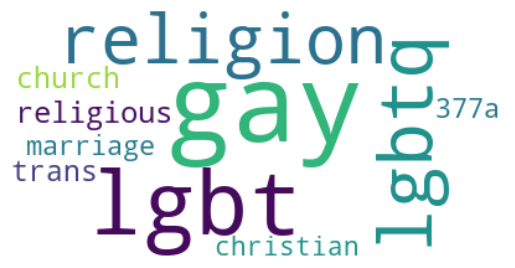

In [60]:
enhanced_BERTopic_WordCloud(0)

### BERTopic Visualizations

In [85]:
enhanced_topic_model.visualize_topics()

The code below will generate a visualization that is not very interpretable or helpful so the visualization will not be displayed. However, if you still want to see the visualization, feel free to run the code below.

In [ ]:
enhanced_topic_model.visualize_documents(sampled_hate_cleaned['text'])

In [30]:
enhanced_topic_model.visualize_barchart()

In [31]:
enhanced_topic_model.visualize_heatmap()

We will not be visualizing the topic-document probability matrix as it it too computationally expensive to run BERTopic with `calculate_probabilities=True`.

In [32]:
enhanced_topic_model.visualize_hierarchy()

In [33]:
hierarchical_topics = enhanced_topic_model.hierarchical_topics(sampled_hate_cleaned['text'])

100%|██████████| 164/164 [00:01<00:00, 91.68it/s] 


In [34]:
enhanced_topic_model.visualize_hierarchy(hierarchical_topics=hierarchical_topics)

Hovering over the black circles reveals the topic representation at each level of the hierarchy, showing how merging affects topic themes. This view helps identify logical merges and visualize sub-topics within broader themes.

### Merging Topics / Topic Reduction

In [35]:
tree = enhanced_topic_model.get_topic_tree(hierarchical_topics)
print(tree)

.
├─message_mask_compose_food_wear
│    ├─driver_food_bus_road_car
│    │    ├─tea_chicken_sugar_coffee_eat
│    │    │    ├─tea_sugar_coffee_drink_bubble
│    │    │    │    ├─coffee_drink_beer_drinking_caffeine
│    │    │    │    │    ├─■──coffee_caffeine_starbucks_drink_beans ── Topic: 129
│    │    │    │    │    └─■──drink_beer_drinking_drunk_alcohol ── Topic: 127
│    │    │    │    └─tea_sugar_bubble_diabetes_milk
│    │    │    │         ├─■──sugar_diabetes_chocolate_coke_sweet ── Topic: 124
│    │    │    │         └─■──tea_bubble_milk_sugar_pearls ── Topic: 156
│    │    │    └─chicken_burger_eat_fries_kfc
│    │    │         ├─eat_halal_pork_meat_bread
│    │    │         │    ├─eat_bread_breakfast_cake_butter
│    │    │         │    │    ├─■──bread_cake_butter_peanut_cheese ── Topic: 94
│    │    │         │    │    └─■──eat_breakfast_hungry_eating_dinner ── Topic: 58
│    │    │         │    └─■──halal_pork_meat_muslim_vegetarian ── Topic: 105
│    │    │         └─chick

Merge selected topics after inspecting the hierarchy and the merged topics representation at each hierarchy level.

In [ ]:
topics_to_merge = [[124, 156], # tea_sugar_bubble_diabetes_milk
                   [41, 81], # chicken_burger_fries_kfc_mcspicy
                   [104, 69], # fight_punch_knife_slap_gun
                   [25, 91], # weather_rain_climate_heat_aircon
                   [26, 56], # cat_cats_dog_dogs_meow
                   [4, 154], # scam_bank_scammers_app_scammer
                   [32, 78], # movie_netflix_ads_youtube_ad
                   [61, 101], # israel_hamas_ukraine_russia_palestinians
                   [145, 63], # porn_sex_horny_virgin_prostitute
                   [1, 75, 111], # liao_sia_kena_siao_lao
                   [60, 119], # english_mandarin_speak_language_accent
                   [92, 20, 149], # china_ccp_chinese_prc_propaganda
                   [21, 107, 100, 93], # racist_racism_race_indian_chinese
                   [90, 121, 115, 16, 87, 62, 141], # pap_vote_opposition_wp_parliament
                   [66, 83, 97], # ns_nsfs_saf_nsf_army
                   [53, 47], # women_men_gender_equality_male
                   [37, 99], # friendship_relationship_friendships_meet_ex
                   [147, 126, 79, 59], # rude_angry_mad_anger_ignore
                   [112, 29], # iq_idiot_stupidity_smart_government
                   [82, 45], # depression_therapy_mental_mentally_illness
                   [6, 31, 13, 12], # singaporeans_foreigners_singapore_country_singaporean
                   [64, 8], # teachers_teacher_students_degree_uni
                   [109, 116, 114, 46], # boss_interview_hr_bosses_office
                   [103, 40], # hdb_flats_bto_flat_housing
                   [163, 88], # rich_tax_taxes_class_wealth
                   [49, 38, 7], # cases_covid_19_vaccine_vaccinated
                   [9, 15, 68, 27, 136] # drug_drugs_victim_court_jail
                   ]

enhanced_topic_model.merge_topics(sampled_hate_cleaned['text'], topics_to_merge)

Overview of latest topic modelling by BERTopic after merging similar topics above. Total number of topics is also reduced.

In [47]:
enhanced_topic_model.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,POS,KeyBERT_MMR,Representative_Docs
0,-1,131216,-1_chinese_covid_government_pay,"[chinese, covid, government, pay, country, pol...","[singaporeans, singaporean, covid, racist, chi...","[chinese, government, pay, country, police, fo...","[singaporeans, singaporean, covid, racist, chi...",[I thoroughly agree. Men have always had the a...
1,0,4914,0_singaporeans_foreigners_country_singaporean,"[singaporeans, foreigners, country, singaporea...","[singaporeans, singaporean, foreigners, migran...","[foreigners, country, singaporean, foreign, wo...","[singaporeans, singaporean, foreigners, migran...","[Wait, so you're asking for minimum wage only ..."
2,1,4703,1_gay_lgbt_lgbtq_religion,"[gay, lgbt, lgbtq, religion, religious, church...","[homosexual, homosexuality, homosexuals, lgbt,...","[gay, lgbtq, religion, religious, church, tran...","[homosexual, homosexuality, homosexuals, lgbt,...",[it is people like you who set gay rights back...
3,2,4177,2_drug_drugs_victim_court,"[drug, drugs, victim, court, jail, death, poli...","[sentencing, jailed, offender, crimes, convict...","[drug, drugs, victim, court, jail, death, poli...","[sentencing, jailed, offender, crimes, convict...",[&gt; # Man admits trespassing into NUS hall t...
4,3,3901,3_liao_sia_kena_siao,"[liao, sia, kena, siao, lao, jiak, wah, lang, ...","[liao, sia, lian, siu, siao, siong, sian, si, ...","[sia, siao, boi, nasi, kenna, sian, peng, lema...","[liao, sia, lian, siu, siao, siong, sian, si, ...","[die liao lor, die liao die liao this time rea..."
...,...,...,...,...,...,...,...,...
114,113,214,113_slavery_slave_slaves_modern,"[slavery, slave, slaves, modern, corporate, wa...","[slavery, slave, slaves, enslaved, slavers, sl...","[slavery, slave, slaves, modern, corporate, wa...","[slavery, slave, slaves, enslaved, slavers, sl...","[in after someone say its slavery, Wtf is this..."
115,114,212,114_delivery_parcel_delivered_singpost,"[delivery, parcel, delivered, singpost, order,...","[deliveries, delivery, deliver, shipping, ship...","[delivery, parcel, singpost, order, items, sho...","[deliveries, delivery, deliver, shipping, ship...",[Bought a fan from Shopee and they claim they ...
116,115,209,115_bot_bots_thy_user,"[bot, bots, thy, user, shakespeare, full_list_...","[bot, bots, chatbot, botrank, chatbots, robot,...","[bot, bots, user, bible, boop, optout, robot, ...","[bot, bots, chatbot, botrank, chatbots, robot,...","[good bot, Wait what? There's such a bot? Lol,..."
117,116,205,116_art_artist_logo_draw,"[art, artist, logo, draw, drawing, artists, pa...","[art, artwork, artworks, arts, artistic, paint...","[art, artist, logo, drawing, artists, painting...","[art, artwork, artworks, arts, artistic, paint...","[Live art, BuT iTs ArT!!, this is what i call ..."


In [48]:
enhanced_topic_model.get_topic_info()[:30]

,Topic,Count,Name,Representation,KeyBERT,POS,KeyBERT_MMR,Representative_Docs
0,-1,131216,-1_chinese_covid_government_pay,"[chinese, covid, government, pay, country, pol...","[singaporeans, singaporean, covid, racist, chi...","[chinese, government, pay, country, police, fo...","[singaporeans, singaporean, covid, racist, chi...",[I thoroughly agree. Men have always had the a...
1,0,4914,0_singaporeans_foreigners_country_singaporean,"[singaporeans, foreigners, country, singaporea...","[singaporeans, singaporean, foreigners, migran...","[foreigners, country, singaporean, foreign, wo...","[singaporeans, singaporean, foreigners, migran...","[Wait, so you're asking for minimum wage only ..."
2,1,4703,1_gay_lgbt_lgbtq_religion,"[gay, lgbt, lgbtq, religion, religious, church...","[homosexual, homosexuality, homosexuals, lgbt,...","[gay, lgbtq, religion, religious, church, tran...","[homosexual, homosexuality, homosexuals, lgbt,...",[it is people like you who set gay rights back...
3,2,4177,2_drug_drugs_victim_court,"[drug, drugs, victim, court, jail, death, poli...","[sentencing, jailed, offender, crimes, convict...","[drug, drugs, victim, court, jail, death, poli...","[sentencing, jailed, offender, crimes, convict...",[&gt; # Man admits trespassing into NUS hall t...
4,3,3901,3_liao_sia_kena_siao,"[liao, sia, kena, siao, lao, jiak, wah, lang, ...","[liao, sia, lian, siu, siao, siong, sian, si, ...","[sia, siao, boi, nasi, kenna, sian, peng, lema...","[liao, sia, lian, siu, siao, siong, sian, si, ...","[die liao lor, die liao die liao this time rea..."
5,4,3286,4_pap_vote_opposition_wp,"[pap, vote, opposition, wp, parliament, tharma...","[pap, pa, psp, mp, sdp, mps, parliament, oppo,...","[pap, vote, opposition, parliament, tharman, p...","[pap, pa, psp, mp, sdp, mps, parliament, oppo,...","[Then go back to r/pap bro wtf, Because the PA..."
6,5,2872,5_cases_covid_19_vaccine,"[cases, covid, 19, vaccine, vaccinated, moh, v...","[covid, coronavirus, outbreak, infectious, vac...","[cases, vaccine, vaccinated, vaccines, vaccina...","[covid, coronavirus, outbreak, infectious, vac...","[&gt; # Singapore reports 25th COVID-19 death,..."
7,6,2714,6_road_car_cyclists_driver,"[road, car, cyclists, driver, drivers, cyclist...","[cyclist, cyclists, cycling, lanes, driving, p...","[road, car, cyclists, driver, drivers, cyclist...","[cyclist, cyclists, cycling, lanes, driving, p...",[Been driving since got my license (3 months a...
8,7,2454,7_hahaha_joke_hilarious_hahahaha,"[hahaha, joke, hilarious, hahahaha, laugh, ikr...","[hahahaha, hahahahaha, hahaha, hahahhahaha, ha...","[joke, hilarious, hahahaha, ikr, oops, usernam...","[hahahaha, hahahahaha, hahaha, hahahhahaha, ha...","[Hahaha 😆, Now, get out of Reddit hahaha, Wtf ..."
9,8,2070,8_scam_bank_scammers_app,"[scam, bank, scammers, app, card, scammer, ocb...","[scam, scamming, scams, scammer, scammed, scam...","[scam, bank, scammers, app, card, scammer, ocb...","[scam, scamming, scams, scammer, scammed, scam...","[Definitely a scam, Why would u help scammers ..."


Updating the previous topic labels after merging similar topics.

In [44]:
enhanced_topic_labels, _ = enhanced_topic_model.transform(sampled_hate_cleaned['text'], embeddings=embeddings)

2024-11-09 02:00:08,486 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-11-09 02:00:10,684 - BERTopic - Dimensionality - Completed ✓
2024-11-09 02:00:10,687 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-11-09 02:00:23,256 - BERTopic - Cluster - Completed ✓


### Analysing BERTopic Outliers & Outlier Reduction

There are a lot of outliers (`topic_id`=-1) in BERTopic's topic overview. As seen below, many of these outlier comments can be forced to a topic that is already found by BERTopic.

In [51]:
# Get all texts for topic_id
topic_id = -1
topic_texts = get_text_for_enhanced_topic(topic_id)

# Display topic_id texts
for i, text in enumerate(topic_texts[:10], 1):
    print(f"Document {i}: {text}\n")

Document 1: bring an umbrella! it gets really hot during the day. get motion sickness pills if you got seasickness. bring snacks and water.

Document 2: I must try again!!!

(∩｡･ｏ･｡)っ.ﾟ☆｡’`~~~zZzZzZzZzZzZzZzZ

Document 3: time to reconsider your choice. lying + nonchalant about it + doesn’t respect you. not ideal

Document 4: Ahhh yes, the worst Smash character

Document 5: lol,  not safe for wifes.

Document 6: My post yesterday stated that years ago I already did something similar for people who's heartbroken and it already worked before. There were about 10 of us back then and everyone was genuine and it helped the whole lot of us back then.

Why would anyone want to join a group like this to fabricate a sob story, what purpose does that serve? What could they possibly gain from doing that? 

Way too much cynicism.

Document 7: I used to hate going to school cos i will be bullied and teased by my classmates especially girls because i was a very shy and quiet guy due to that and othe

| Strategy        | Best For                          | Pros                                               | Cons                               |
|-----------------|-----------------------------------|----------------------------------------------------|-------------------------------------|
| Distributions   | Diverse data, probabilistic needs | Soft, probability-based association with topics    | May lack clear topic interpretability |
| c-TF-IDF        | Clear-cut themes, distinct topics | Highly interpretable topics, intuitive clustering  | Less nuanced with context          |
| Embeddings      | Context-sensitive, nuanced data   | Captures complex semantic relationships            | May sacrifice interpretability      |

Reducing outliers through 2 main strategies: c-TF-IDF, followed by Distributions.

In [52]:
new_topic_labels = enhanced_topic_model.reduce_outliers(sampled_hate_cleaned['text'], enhanced_topic_labels, embeddings=embeddings, strategy="c-tf-idf", threshold=0.2)
new_topic_labels = enhanced_topic_model.reduce_outliers(sampled_hate_cleaned['text'], new_topic_labels, embeddings=embeddings, strategy="distributions")

100%|██████████| 122/122 [00:27<00:00,  4.47it/s]


`enhanced_topic_number` and `enhanced_topic_words` are the topic number and topic words after merging of topics but before topic outlier reduction.

`new_topic_number` and `new_topic_words` are the topic number and topic words after merging of topics and topic outlier reduction.

In [56]:
# Create a function to map topic numbers to their words
def enhanced_get_topic_words(topic):
    return ' '.join([word for word, _ in enhanced_topic_model.get_topic(topic, full=True)['POS']][:4])

sampled_hate_cleaned['enhanced_topic_number'] = enhanced_topic_labels
sampled_hate_cleaned['enhanced_topic_words'] = sampled_hate_cleaned['enhanced_topic_number'].apply(enhanced_get_topic_words)
sampled_hate_cleaned['new_topic_number'] = new_topic_labels
sampled_hate_cleaned['new_topic_words'] = sampled_hate_cleaned['new_topic_number'].apply(enhanced_get_topic_words)

In [57]:
outliers_transformed = sampled_hate_cleaned[sampled_hate_cleaned['enhanced_topic_number'] != sampled_hate_cleaned['new_topic_number']].reset_index(drop=True)

Based on the samples below, we can see that the topic outlier reduction has done quite a good job at matching an outlier topic comment to an already existing and related topic.

In [58]:
for i in range(10):
    print("-"*50)
    print(outliers_transformed['text'].iloc[i])
    print(f"New Topic: {outliers_transformed['new_topic_words'].iloc[i]}")

--------------------------------------------------
bring an umbrella! it gets really hot during the day. get motion sickness pills if you got seasickness. bring snacks and water.
New Topic: weather rain climate heat
--------------------------------------------------
time to reconsider your choice. lying + nonchalant about it + doesn’t respect you. not ideal
New Topic: dad child children mom
--------------------------------------------------
Ahhh yes, the worst Smash character
New Topic: movie netflix ads watch
--------------------------------------------------
lol,  not safe for wifes.
New Topic: road car cyclists driver
--------------------------------------------------
My post yesterday stated that years ago I already did something similar for people who's heartbroken and it already worked before. There were about 10 of us back then and everyone was genuine and it helped the whole lot of us back then.

Why would anyone want to join a group like this to fabricate a sob story, what pur

Originally, there are a total of 131216 outlier topic comments. After the outlier reduction, we are able to assign a whopping 127680 outlier topic comments to an already existing topic.

In [59]:
outliers_transformed

,text,timestamp,username,link,link_id,parent_id,id,subreddit_id,moderation,BERT_2_hate,nltk_processed_text,enhanced_topic_number,enhanced_topic_words,new_topic_number,new_topic_words
0,bring an umbrella! it gets really hot during t...,2020-01-01 00:13:37,WiisdomTooth,/r/singapore/comments/ei2z6d/what_is_there_to_...,t3_ei2z6d,t3_ei2z6d,fcoosvb,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,bring umbrella get really hot day get motion s...,-1,chinese government pay country,18,weather rain climate heat
1,time to reconsider your choice. lying + noncha...,2020-01-01 00:57:51,fishballmeepok,/r/singapore/comments/ei9klf/rsingapore_random...,t3_ei9klf,t1_fcojmlo,fcose5a,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,time reconsider choice lying nonchalant respec...,-1,chinese government pay country,11,dad child children mom
2,"Ahhh yes, the worst Smash character",2020-01-01 01:08:58,Anti-DenseMan,/r/singapore/comments/ei5j7w/happy_new_year_rs...,t3_ei5j7w,t3_ei5j7w,fcot9kx,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,ahhh yes worst smash character,-1,chinese government pay country,20,movie netflix ads watch
3,"lol, not safe for wifes.",2020-01-01 02:39:15,SG-ForeignInfluenzer,/r/singapore/comments/eiaodj/barbrothers_singa...,t3_eiaodj,t1_fcosxhm,fcp01io,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,lol safe wife,-1,chinese government pay country,6,road car cyclists driver
4,My post yesterday stated that years ago I alre...,2020-01-01 03:43:21,Catbear83,/r/singapore/comments/ei9klf/rsingapore_random...,t3_ei9klf,t1_fcp0ze8,fcp4hx0,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,post yesterday stated year ago already somethi...,-1,chinese government pay country,19,ns women saf nsfs
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
127675,"Oh, live for yourself? But under your parent r...",2023-10-31 23:26:29,chilligangster,/r/SingaporeRaw/comments/17kx4d2/found_out_im_...,t3_17kx4d2,t1_k7anulo,k7aqbg2,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,oh live parent roof need cpf pay uni tuition m...,-1,chinese government pay country,10,teachers teacher students degree
127676,I have made a police report,2023-10-31 23:37:39,sierakm,/r/SingaporeRaw/comments/17kn4q8/spotify_stude...,t3_17kn4q8,t3_17kn4q8,k7artzc,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,made police report,-1,chinese government pay country,2,drug drugs victim court
127677,Please no racism here,2023-10-31 23:38:43,sierakm,/r/SingaporeRaw/comments/17krbv3/chart_showing...,t3_17krbv3,t3_17krbv3,k7arzbc,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,please racism,-1,chinese government pay country,9,racist racism race chinese
127678,Are u a robot?,2023-10-31 23:42:01,hurricanechan,/r/SingaporeRaw/comments/17kfd7v/majulah_singa...,t3_17kfd7v,t1_k78jq5u,k7asffm,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,u robot,-1,chinese government pay country,115,bot bots user bible


### Transforming the remaining hate/toxic comments that were not in the sampled dataset

In [80]:
other_rows = deberta_cleaned_hate[~deberta_cleaned_hate['id'].isin(sampled_hate_cleaned['id'])].reset_index(drop=True)

In [81]:
other_rows = other_rows[other_rows['nltk_processed_text'] != ''].reset_index(drop=True)

In [82]:
len(other_rows)

1317749

The code below processes 1,317,749 rows in manageable batches, encoding text data with a pre-trained language model (`all-MiniLM-L6-v2`) and applying topic modeling. Here’s the breakdown:

- Batch Setup: Divides other_rows into smaller batches of 200,000 rows.
- Encoding: For each batch, encodes the text into embeddings using SentenceTransformer and stores them.
- Topic Transformation: Applies topic modeling on the batch using pre-computed embeddings to generate initial topic labels.
- Outlier Reduction: Refines topic labels by removing outliers, using two strategies to improve topic quality.
- Storage: Saves both the initial and refined topic labels for further analysis.

In [85]:
# Define your batch size
batch_size = 200000  
num_batches = (len(other_rows) + batch_size - 1) // batch_size  # Total batches, ensuring no index error

# Prepare lists to store all results and embeddings
other_enhanced_topics = []
other_new_topics = []
all_embeddings = []  # To store all embeddings
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")

# Process data in batches
for i in range(num_batches):
    # Select the batch, handling the last batch if it has fewer than batch_size rows
    start_idx = i * batch_size
    end_idx = min((i + 1) * batch_size, len(other_rows))
    batch = other_rows.iloc[start_idx:end_idx]
    batch = batch.reset_index(drop=True)
    
    print(f"Processing batch {i + 1}/{num_batches} (rows {start_idx} to {end_idx - 1})")
    
    # Encode the batch and store embeddings
    batch_embeddings = embedding_model.encode(batch['text'], show_progress_bar=True)
    all_embeddings.append(batch_embeddings)  # Append each batch's embeddings as a single item
    
    # Apply topic transformation and outlier reduction
    batch_topics, _ = enhanced_topic_model.transform(batch['text'], embeddings=batch_embeddings)
    batch_topic_labels = enhanced_topic_model.reduce_outliers(batch['text'], batch_topics, embeddings=batch_embeddings, strategy="c-tf-idf", threshold=0.2)
    batch_topic_labels = enhanced_topic_model.reduce_outliers(batch['text'], batch_topic_labels, embeddings=batch_embeddings, strategy="distributions")
    
    # Store the topic labels for each batch
    other_enhanced_topics.extend(batch_topics) 
    other_new_topics.extend(batch_topic_labels)

Processing batch 1/7 (rows 0 to 199999)


Batches:   0%|          | 0/6250 [00:00<?, ?it/s]

2024-11-09 03:16:29,124 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-11-09 03:18:07,915 - BERTopic - Dimensionality - Completed ✓
2024-11-09 03:18:07,916 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-11-09 03:18:20,845 - BERTopic - Cluster - Completed ✓
100%|██████████| 117/117 [00:22<00:00,  5.17it/s]


Processing batch 2/7 (rows 200000 to 399999)


Batches:   0%|          | 0/6250 [00:00<?, ?it/s]

2024-11-09 03:35:15,747 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-11-09 03:36:20,014 - BERTopic - Dimensionality - Completed ✓
2024-11-09 03:36:20,015 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-11-09 03:36:33,360 - BERTopic - Cluster - Completed ✓
100%|██████████| 114/114 [00:21<00:00,  5.18it/s]


Processing batch 3/7 (rows 400000 to 599999)


Batches:   0%|          | 0/6250 [00:00<?, ?it/s]

2024-11-09 03:52:24,032 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-11-09 03:53:29,077 - BERTopic - Dimensionality - Completed ✓
2024-11-09 03:53:29,078 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-11-09 03:53:42,963 - BERTopic - Cluster - Completed ✓
100%|██████████| 114/114 [00:27<00:00,  4.13it/s]


Processing batch 4/7 (rows 600000 to 799999)


Batches:   0%|          | 0/6250 [00:00<?, ?it/s]

2024-11-09 04:11:33,266 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-11-09 04:12:38,687 - BERTopic - Dimensionality - Completed ✓
2024-11-09 04:12:38,689 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-11-09 04:12:52,030 - BERTopic - Cluster - Completed ✓
100%|██████████| 115/115 [00:24<00:00,  4.79it/s]


Processing batch 5/7 (rows 800000 to 999999)


Batches:   0%|          | 0/6250 [00:00<?, ?it/s]

2024-11-09 04:27:53,590 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-11-09 04:28:58,021 - BERTopic - Dimensionality - Completed ✓
2024-11-09 04:28:58,022 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-11-09 04:29:12,622 - BERTopic - Cluster - Completed ✓
100%|██████████| 110/110 [00:20<00:00,  5.31it/s]


Processing batch 6/7 (rows 1000000 to 1199999)


Batches:   0%|          | 0/6250 [00:00<?, ?it/s]

2024-11-09 04:44:11,687 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-11-09 04:45:17,577 - BERTopic - Dimensionality - Completed ✓
2024-11-09 04:45:17,579 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-11-09 04:45:31,282 - BERTopic - Cluster - Completed ✓
100%|██████████| 111/111 [00:23<00:00,  4.80it/s]


Processing batch 7/7 (rows 1200000 to 1317748)


Batches:   0%|          | 0/3680 [00:00<?, ?it/s]

2024-11-09 04:54:24,736 - BERTopic - Dimensionality - Reducing dimensionality of input embeddings.
2024-11-09 04:55:04,976 - BERTopic - Dimensionality - Completed ✓
2024-11-09 04:55:04,979 - BERTopic - Clustering - Approximating new points with `hdbscan_model`
2024-11-09 04:55:13,156 - BERTopic - Cluster - Completed ✓
100%|██████████| 68/68 [00:15<00:00,  4.44it/s]


### Finalizing Topics

In [89]:
sampled_hate_cleaned

,text,timestamp,username,link,link_id,parent_id,id,subreddit_id,moderation,BERT_2_hate,nltk_processed_text,enhanced_topic_number,enhanced_topic_words,new_topic_number,new_topic_words
0,bring an umbrella! it gets really hot during t...,2020-01-01 00:13:37,WiisdomTooth,/r/singapore/comments/ei2z6d/what_is_there_to_...,t3_ei2z6d,t3_ei2z6d,fcoosvb,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,bring umbrella get really hot day get motion s...,-1,chinese government pay country,18,weather rain climate heat
1,got home @ like 4+ from reddit meetup and just...,2020-01-01 00:28:32,gmdotes,/r/singapore/comments/ei9klf/rsingapore_random...,t3_ei9klf,t3_ei9klf,fcoq0v3,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,got home like reddit meetup woke regret ca sle...,21,sleep tired alarm morning,21,sleep tired alarm morning
2,I must try again!!!\n\n(∩｡･ｏ･｡)っ.ﾟ☆｡’`~~~zZzZz...,2020-01-01 00:32:13,LvL9999ZMonster,/r/singapore/comments/ei9klf/rsingapore_random...,t3_ei9klf,t1_fcoq0v3,fcoqbsn,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,must try,-1,chinese government pay country,-1,chinese government pay country
3,Lol. PMD anarchist.,2020-01-01 00:36:27,Kazozo,/r/singapore/comments/ei8sd5/pmd_rider_arreste...,t3_ei8sd5,t3_ei8sd5,fcoqo9v,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,lol pmd anarchist,6,road car cyclists driver,6,road car cyclists driver
4,time to reconsider your choice. lying + noncha...,2020-01-01 00:57:51,fishballmeepok,/r/singapore/comments/ei9klf/rsingapore_random...,t3_ei9klf,t1_fcojmlo,fcose5a,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,time reconsider choice lying nonchalant respec...,-1,chinese government pay country,11,dad child children mom
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
229351,I have made a police report,2023-10-31 23:37:39,sierakm,/r/SingaporeRaw/comments/17kn4q8/spotify_stude...,t3_17kn4q8,t3_17kn4q8,k7artzc,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,made police report,-1,chinese government pay country,2,drug drugs victim court
229352,Please no racism here,2023-10-31 23:38:43,sierakm,/r/SingaporeRaw/comments/17krbv3/chart_showing...,t3_17krbv3,t3_17krbv3,k7arzbc,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,please racism,-1,chinese government pay country,9,racist racism race chinese
229353,Are u a robot?,2023-10-31 23:42:01,hurricanechan,/r/SingaporeRaw/comments/17kfd7v/majulah_singa...,t3_17kfd7v,t1_k78jq5u,k7asffm,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,u robot,-1,chinese government pay country,115,bot bots user bible
229354,Declare gay and excuse stay in!,2023-10-31 23:44:39,PopYourNuts,/r/SingaporeRaw/comments/17kx4d2/found_out_im_...,t3_17kx4d2,t3_17kx4d2,k7ass7e,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,declare gay excuse stay,1,gay lgbtq religion religious,1,gay lgbtq religion religious


In [90]:
other_rows['enhanced_topic_number'] = other_enhanced_topics
other_rows['enhanced_topic_words'] = other_rows['enhanced_topic_number'].apply(enhanced_get_topic_words)
other_rows['new_topic_number'] = other_new_topics
other_rows['new_topic_words'] = other_rows['new_topic_number'].apply(enhanced_get_topic_words)

In [91]:
other_rows

,text,timestamp,username,link,link_id,parent_id,id,subreddit_id,moderation,BERT_2_hate,nltk_processed_text,enhanced_topic_number,enhanced_topic_words,new_topic_number,new_topic_words
0,eReCtIoN tImE BOIS,2020-01-01 00:15:37,auroraxan,/r/singapore/comments/ei17ye/budget_2020_will_...,t3_ei17ye,t3_ei17ye,fcooyu9,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,erection time bois,-1,chinese government pay country,47,mall bomb malls building
1,Let me try to send you back to sleep!\n\n(∩｡･ｏ...,2020-01-01 00:19:24,LvL9999ZMonster,/r/singapore/comments/ei9klf/rsingapore_random...,t3_ei9klf,t1_fcoi1cy,fcop9yc,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,let try send back sleep,-1,chinese government pay country,21,sleep tired alarm morning
2,Lol I was hanging out with friends til 5 too a...,2020-01-01 00:30:45,[deleted],/r/singapore/comments/ei9klf/rsingapore_random...,t3_ei9klf,t1_fcoq0v3,fcoq7fr,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,lol hanging friend til damn tired like old man,-1,chinese government pay country,21,sleep tired alarm morning
3,The mediacorp Chinese section also produces ve...,2020-01-01 00:32:08,Kazozo,/r/singapore/comments/ehweul/cna_actually_prod...,t3_ehweul,t3_ehweul,fcoqbkh,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,mediacorp chinese section also produce good in...,-1,chinese government pay country,60,news article headline fake
4,"30 mins into showing up at work at 7am, I alre...",2020-01-01 00:33:23,SwordLaker,/r/singapore/comments/ei9klf/rsingapore_random...,t3_ei9klf,t3_ei9klf,fcoqfaj,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,min showing work already screamed wtf pissed s...,-1,chinese government pay country,21,sleep tired alarm morning
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1317744,Chain of command? You think a family is the ar...,2023-10-31 23:38:53,Prestigious-Toe8622,/r/SingaporeRaw/comments/17kx4d2/found_out_im_...,t3_17kx4d2,t1_k7argnj,k7as06g,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,chain command think family army ah becoming cl...,0,foreigners country singaporean foreign,0,foreigners country singaporean foreign
1317745,Saf? No problem one lah. Sect377a has been rep...,2023-10-31 23:51:06,chilligangster,/r/SingaporeRaw/comments/17kx4d2/found_out_im_...,t3_17kx4d2,t1_k7aruti,k7atn7z,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,saf problem one lah repealed anyway go molest ...,19,ns women saf nsfs,19,ns women saf nsfs
1317746,"Of course they do, just not on Reddit. Check W...",2023-10-31 23:51:57,Prestigious-Toe8622,/r/SingaporeRaw/comments/17key03/why_are_most_...,t3_17key03,t1_k7atd3s,k7atrc3,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,course reddit check weibo wechat etc full ppl ...,-1,chinese government pay country,9,racist racism race chinese
1317747,So you had emigrated to other countries? Then ...,2023-10-31 23:55:16,chilligangster,/r/SingaporeRaw/comments/17kx4d2/found_out_im_...,t3_17kx4d2,t1_k7as06g,k7au7a7,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,emigrated country come sg forum f use parent f...,0,foreigners country singaporean foreign,0,foreigners country singaporean foreign


In [94]:
hate_toxic_topical_comments = pd.concat([sampled_hate_cleaned, other_rows]).reset_index(drop=True)

In [97]:
hate_toxic_topical_comments

,text,timestamp,username,link,link_id,parent_id,id,subreddit_id,moderation,BERT_2_hate,nltk_processed_text,enhanced_topic_number,enhanced_topic_words,new_topic_number,new_topic_words
0,bring an umbrella! it gets really hot during t...,2020-01-01 00:13:37,WiisdomTooth,/r/singapore/comments/ei2z6d/what_is_there_to_...,t3_ei2z6d,t3_ei2z6d,fcoosvb,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,bring umbrella get really hot day get motion s...,-1,chinese government pay country,18,weather rain climate heat
1,got home @ like 4+ from reddit meetup and just...,2020-01-01 00:28:32,gmdotes,/r/singapore/comments/ei9klf/rsingapore_random...,t3_ei9klf,t3_ei9klf,fcoq0v3,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,got home like reddit meetup woke regret ca sle...,21,sleep tired alarm morning,21,sleep tired alarm morning
2,I must try again!!!\n\n(∩｡･ｏ･｡)っ.ﾟ☆｡’`~~~zZzZz...,2020-01-01 00:32:13,LvL9999ZMonster,/r/singapore/comments/ei9klf/rsingapore_random...,t3_ei9klf,t1_fcoq0v3,fcoqbsn,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,must try,-1,chinese government pay country,-1,chinese government pay country
3,Lol. PMD anarchist.,2020-01-01 00:36:27,Kazozo,/r/singapore/comments/ei8sd5/pmd_rider_arreste...,t3_ei8sd5,t3_ei8sd5,fcoqo9v,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,lol pmd anarchist,6,road car cyclists driver,6,road car cyclists driver
4,time to reconsider your choice. lying + noncha...,2020-01-01 00:57:51,fishballmeepok,/r/singapore/comments/ei9klf/rsingapore_random...,t3_ei9klf,t1_fcojmlo,fcose5a,t5_2qh8c,"{'removal_reason': None, 'collapsed': False, '...",True,time reconsider choice lying nonchalant respec...,-1,chinese government pay country,11,dad child children mom
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1547100,Chain of command? You think a family is the ar...,2023-10-31 23:38:53,Prestigious-Toe8622,/r/SingaporeRaw/comments/17kx4d2/found_out_im_...,t3_17kx4d2,t1_k7argnj,k7as06g,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,chain command think family army ah becoming cl...,0,foreigners country singaporean foreign,0,foreigners country singaporean foreign
1547101,Saf? No problem one lah. Sect377a has been rep...,2023-10-31 23:51:06,chilligangster,/r/SingaporeRaw/comments/17kx4d2/found_out_im_...,t3_17kx4d2,t1_k7aruti,k7atn7z,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,saf problem one lah repealed anyway go molest ...,19,ns women saf nsfs,19,ns women saf nsfs
1547102,"Of course they do, just not on Reddit. Check W...",2023-10-31 23:51:57,Prestigious-Toe8622,/r/SingaporeRaw/comments/17key03/why_are_most_...,t3_17key03,t1_k7atd3s,k7atrc3,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,course reddit check weibo wechat etc full ppl ...,-1,chinese government pay country,9,racist racism race chinese
1547103,So you had emigrated to other countries? Then ...,2023-10-31 23:55:16,chilligangster,/r/SingaporeRaw/comments/17kx4d2/found_out_im_...,t3_17kx4d2,t1_k7as06g,k7au7a7,t5_xnx04,"{'banned_at_utc': None, 'mod_reason_by': None,...",True,emigrated country come sg forum f use parent f...,0,foreigners country singaporean foreign,0,foreigners country singaporean foreign


There are a total of 119 topics, one of which is the outlier topic, for the 1,547,105 hate and toxic comments.

In [96]:
len(pd.unique(hate_toxic_topical_comments['new_topic_words']))

119

In [98]:
hate_toxic_topical_comments.to_parquet("./Data/hate_toxic_topical_comments.parquet")

### Saving Generated Embeddings of Hate & Toxic Comments and BERTopic Model (Serialization)

In [106]:
# Concatenate all batch embeddings into a single NumPy array
all_batch_embeddings_array = np.vstack(all_embeddings)

# Concatenate 'embeddings' array at the start of 'all_batch_embeddings_array'
all_embeddings_array = np.vstack([embeddings, all_batch_embeddings_array])

In [107]:
print(all_batch_embeddings_array.shape)
print(embeddings.shape)
print(all_embeddings_array.shape)

(1317749, 384)
(229356, 384)
(1547105, 384)


In [108]:
# Save the concatenated embeddings array
np.save("./Data/hate_toxic_embeddings.npy", all_embeddings_array)

In [111]:
enhanced_topic_model.get_topic_info()

,Topic,Count,Name,Representation,KeyBERT,POS,KeyBERT_MMR,Representative_Docs
0,-1,131216,-1_chinese_covid_government_pay,"[chinese, covid, government, pay, country, pol...","[singaporeans, singaporean, covid, racist, chi...","[chinese, government, pay, country, police, fo...","[singaporeans, singaporean, covid, racist, chi...",[I thoroughly agree. Men have always had the a...
1,0,4914,0_singaporeans_foreigners_country_singaporean,"[singaporeans, foreigners, country, singaporea...","[singaporeans, singaporean, foreigners, migran...","[foreigners, country, singaporean, foreign, wo...","[singaporeans, singaporean, foreigners, migran...","[Wait, so you're asking for minimum wage only ..."
2,1,4703,1_gay_lgbt_lgbtq_religion,"[gay, lgbt, lgbtq, religion, religious, church...","[homosexual, homosexuality, homosexuals, lgbt,...","[gay, lgbtq, religion, religious, church, tran...","[homosexual, homosexuality, homosexuals, lgbt,...",[it is people like you who set gay rights back...
3,2,4177,2_drug_drugs_victim_court,"[drug, drugs, victim, court, jail, death, poli...","[sentencing, jailed, offender, crimes, convict...","[drug, drugs, victim, court, jail, death, poli...","[sentencing, jailed, offender, crimes, convict...",[&gt; # Man admits trespassing into NUS hall t...
4,3,3901,3_liao_sia_kena_siao,"[liao, sia, kena, siao, lao, jiak, wah, lang, ...","[liao, sia, lian, siu, siao, siong, sian, si, ...","[sia, siao, boi, nasi, kenna, sian, peng, lema...","[liao, sia, lian, siu, siao, siong, sian, si, ...","[die liao lor, die liao die liao this time rea..."
...,...,...,...,...,...,...,...,...
114,113,214,113_slavery_slave_slaves_modern,"[slavery, slave, slaves, modern, corporate, wa...","[slavery, slave, slaves, enslaved, slavers, sl...","[slavery, slave, slaves, modern, corporate, wa...","[slavery, slave, slaves, enslaved, slavers, sl...","[in after someone say its slavery, Wtf is this..."
115,114,212,114_delivery_parcel_delivered_singpost,"[delivery, parcel, delivered, singpost, order,...","[deliveries, delivery, deliver, shipping, ship...","[delivery, parcel, singpost, order, items, sho...","[deliveries, delivery, deliver, shipping, ship...",[Bought a fan from Shopee and they claim they ...
116,115,209,115_bot_bots_thy_user,"[bot, bots, thy, user, shakespeare, full_list_...","[bot, bots, chatbot, botrank, chatbots, robot,...","[bot, bots, user, bible, boop, optout, robot, ...","[bot, bots, chatbot, botrank, chatbots, robot,...","[good bot, Wait what? There's such a bot? Lol,..."
117,116,205,116_art_artist_logo_draw,"[art, artist, logo, draw, drawing, artists, pa...","[art, artwork, artworks, arts, artistic, paint...","[art, artist, logo, drawing, artists, painting...","[art, artwork, artworks, arts, artistic, paint...","[Live art, BuT iTs ArT!!, this is what i call ..."


In [112]:
save_embedding_model = "sentence-transformers/all-MiniLM-L6-v2"
enhanced_topic_model.save("./Data/BERTopic_Model", serialization="safetensors", save_ctfidf=True, save_embedding_model=save_embedding_model)

# Time Series Analysis

In [116]:
# Set the number of bins to reduce unique timestamps
enhanced_topics_over_time = enhanced_topic_model.topics_over_time(
    sampled_hate_cleaned['text'], 
    sampled_hate_cleaned['timestamp'], 
    nr_bins=100
)

100it [02:28,  1.49s/it]


In [119]:
enhanced_topic_model.visualize_topics_over_time(enhanced_topics_over_time)

In [83]:
def hate_toxic_frequency_by_topic(topic_number):
    # Filter data by topic number and date
    topic_data = hate_toxic_topical_comments[
        (hate_toxic_topical_comments['new_topic_number'] == topic_number) &
        (hate_toxic_topical_comments['timestamp'] < "2023-10-01")
    ]
    topic = enhanced_get_topic_words(topic_number)
    
    # Sort data by timestamp to ensure proper chronological order
    topic_data = topic_data.sort_values(by='timestamp')
    
    # Group by week and calculate the count
    count_per_week = topic_data.groupby(pd.Grouper(key='timestamp', freq='W')).size().reset_index(name='Count')
    
    # Calculate linear regression for the trend line
    x = np.arange(len(count_per_week))  # Generate a range for x-axis (week indices)
    y = count_per_week['Count'].values  # Get the weekly count values
    slope, intercept = np.polyfit(x, y, 1)  # Fit a linear regression line
    trend_line = slope * x + intercept      # Compute y values for the trend line

    # Set trend line color based on the slope's sign
    trend_line_color = 'red' if slope > 0 else 'green'
    
    # Create a figure
    fig = go.Figure()

    # Add original count line as a blue line
    fig.add_trace(go.Scatter(x=count_per_week['timestamp'], y=count_per_week['Count'],
                             mode='lines', name='Weekly Count',
                             line=dict(color='blue', width=2),
                             hovertemplate='Date: %{x}<br>Count: %{y}'))

    # Add linear regression trend line with solid style and lower opacity
    fig.add_trace(go.Scatter(x=count_per_week['timestamp'], y=trend_line,
                             mode='lines', name='Linear Trend',
                             line=dict(color=trend_line_color, width=2, dash='solid'),
                             opacity=0.6,  # Lower opacity for the trend line
                             hovertemplate='Date: %{x}<br>Trend: %{y:.2f}'))

    # Update layout for aesthetics
    fig.update_layout(
        title=f'Weekly Count of Reddit Hate/Toxic Comments ({topic})',
        title_x=0.5,
        xaxis_title='Date',
        yaxis_title='Count',
        font=dict(family="Arial, sans-serif", size=14, color="black"),
        plot_bgcolor='white',
        paper_bgcolor='white',
        xaxis=dict(
            showline=True,
            showgrid=False,
            linecolor='black',
            tickformat='%b %Y',
            ticks='outside',
            ticklen=8,
        ),
        yaxis=dict(
            showline=True,
            showgrid=True,
            gridcolor='lightgrey',
            linecolor='black',
            zeroline=False
        ),
        hovermode='x unified',
        legend=dict(
            x=0.8,
            y=1.1,
            bgcolor='rgba(0,0,0,0)',
            bordercolor='rgba(0,0,0,0)'
        )
    )

    # Show the plot
    fig.show()

In [144]:
for i in range(0, 10):
    hate_toxic_frequency_by_topic(i)

# Identify Correlations with External Events (with LLMs)

Overlay external events (e.g., political events, news articles, or policies) to see if spikes in toxicity/hate correlate with specific occurrences.

References:

- [KeyBERT](https://github.com/MaartenGr/KeyBERT)
- [KeyPhraseVectorizers](https://towardsdatascience.com/enhancing-keybert-keyword-extraction-results-with-keyphrasevectorizers-3796fa93f4db)

In [ ]:
final_topics_overview = enhanced_topic_model.get_topic_info()

In [255]:
final_topics_overview.to_parquet("./Data/final_topics_overview.parquet")

In [ ]:
# final_topics_overview = pd.read_parquet("./Data/final_topics_overview.parquet")
# hate_toxic_topical_comments = pd.read_parquet("./Data/hate_toxic_topical_comments.parquet")

Using KeyBERT for keyword extraction to find out what are the drivers of spikes/increase in toxicity/hate of a specific topic and time period.

In [58]:
# Function to get topic words as a set with additional common words
def get_topic_words_set(topics_overview, topic_number, additional_words=None):
    pos = list(topics_overview[topics_overview['Topic'] == topic_number]['POS'].reset_index(drop=True).iloc[0])
    kbmmr = list(topics_overview[topics_overview['Topic'] == topic_number]['KeyBERT_MMR'].reset_index(drop=True).iloc[0])
    kb = list(topics_overview[topics_overview['Topic'] == topic_number]['KeyBERT'].reset_index(drop=True).iloc[0])
    main = list(topics_overview[topics_overview['Topic'] == topic_number]['Representation'].reset_index(drop=True).iloc[0])
    topic_words_set = set(pos + kbmmr + kb + main)
    if additional_words:
        topic_words_set.update(additional_words)
    return topic_words_set

# Define a function to remove words from each comment
def remove_words(text, words_to_remove):
    # Split text into words, remove any word in words_to_remove, then join back into a single string
    return ' '.join([word for word in text.split() if word.lower() not in words_to_remove])

def prepare_document(topic_number, start_date, end_date, topics_overview, additional_words):
    # Filter comments by topic
    topic_comments = hate_toxic_topical_comments[hate_toxic_topical_comments["new_topic_number"] == topic_number].reset_index(drop=True)
    
    # Filter comments by date range
    filtered_comments = topic_comments[(topic_comments['timestamp'] >= start_date) & (topic_comments['timestamp'] < end_date)]
    
    # Get topic words set for removal
    topic_words_set = get_topic_words_set(topics_overview, topic_number, additional_words)

    # Clean text by removing words in the topic words set
    filtered_comments['text_cleaned'] = filtered_comments['nltk_processed_text'].apply(
        lambda x: remove_words(x, topic_words_set)
    )
    
    # Filter out rows with NaN values
    filtered_comments = filtered_comments[filtered_comments['text_cleaned'].notna()]
    
    return filtered_comments['text_cleaned']

def generate_keyword_wordcloud(docs, ngram_range=(1, 2), top_n=10, diversity=0.5):
    kw_model = KeyBERT()

    # Extract keywords
    keywords = kw_model.extract_keywords(docs=list(docs), keyphrase_ngram_range=ngram_range, top_n=top_n, diversity=diversity)
    
    # Flatten all keyword phrases across lists
    all_phrases = [phrase for sublist in keywords for phrase, _ in sublist]

    # Count the frequency of each phrase
    phrase_counts = Counter(all_phrases)

    # Get the top 20 most frequent phrases
    top_20_phrases = phrase_counts.most_common(20)
    top_20_phrase_counts = dict(top_20_phrases)

    # Create and display word cloud based on top 20 phrases
    top_20_wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_20_phrase_counts)

    plt.figure(figsize=(10, 5))
    plt.imshow(top_20_wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

## gay lgbtq religion religious

In [351]:
gay_topic = 1
hate_toxic_frequency_by_topic(gay_topic)

1. **June-July 2020**: Singapore held its General Election on July 10, 2020. This period often sees increased political discussions, with LGBTQ and religious topics surfacing as part of social and moral discourse. Although Pride Month is globally recognized in June, discussions around LGBTQ issues may have extended into July, sparking polarized reactions.

2. **February 28, 2022**: Singapore's **Court of Appeal dismissed challenges to Section 377A**, affirming that the law was "unenforceable," but it was not formally repealed. This decision likely rekindled discussions about the law and LGBTQ rights.

3. **April-July 2022**: There were various public discussions and events leading up to the National Day Rally announcement, including **town halls and religious group discussions** on the potential repeal of Section 377A. These events might have triggered spikes in toxic comments, particularly in July 2022 when Minister K Shanmugam confirmed that the government was considering repealing the law.

4. **August 21, 2022**: During Singapore's National Day Rally, Prime Minister Lee Hsien Loong announced the **repeal of Section 377A**, a colonial-era law that criminalized sex between men. This was a highly significant moment in LGBTQ history in Singapore, sparking both support and backlash from various communities, including religious groups. The government's simultaneous decision to amend the Constitution to protect the legal definition of marriage as between a man and a woman was also announced. This debate likely led to significant online discussions and possible spikes in toxic comments.

These key moments, particularly around the announcements on Section 377A, likely drove spikes in online discourse, especially within topics relating to LGBTQ issues, religion, and societal norms.

### Diving Deeper

In [59]:
additional_words = {"singapore", "singaporean"}

# Prepare data for specific periods
gay_jun_jul_2020 = prepare_document(
    topic_number=gay_topic,
    start_date="2020-06-01",
    end_date="2020-08-01",
    topics_overview=final_topics_overview,
    additional_words=additional_words
)
gay_jul_aug_2022 = prepare_document(
    topic_number=gay_topic,
    start_date="2022-07-01",
    end_date="2022-09-01",
    topics_overview=final_topics_overview,
    additional_words=additional_words
)

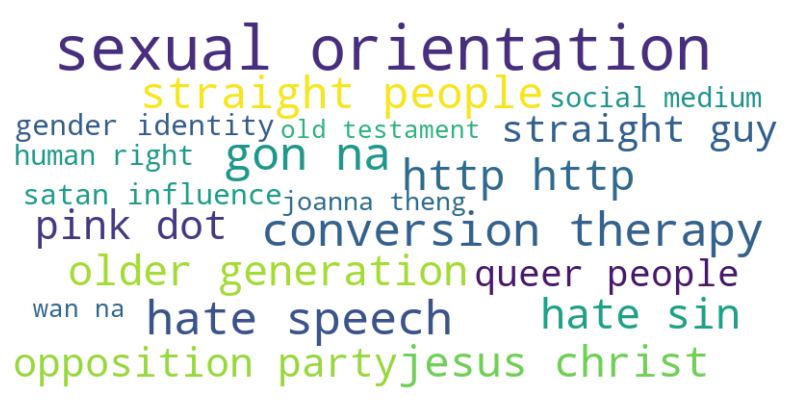

In [60]:
generate_keyword_wordcloud(docs=gay_jun_jul_2020, ngram_range=(2, 2), top_n=15, diversity=0.8)

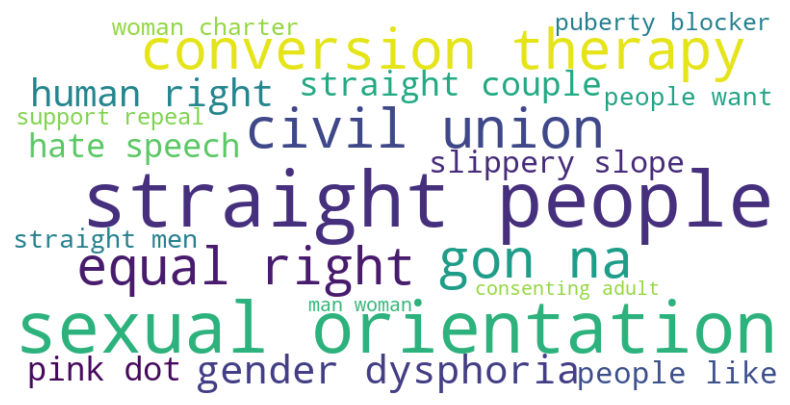

In [61]:
generate_keyword_wordcloud(docs=gay_jul_aug_2022, ngram_range=(2, 2), top_n=15, diversity=0.8)

## pap vote opposition parliament

In [147]:
pap_topic = 4
hate_toxic_frequency_by_topic(pap_topic)

1. **July 2020**: Singapore’s General Election was held on July 10, 2020. This event generated substantial discussion and debate among citizens, with heightened sentiments surrounding the ruling PAP, opposition parties, and topics of governance. This election saw the opposition Workers' Party (WP) winning more seats, and it marked the first time an opposition party won two Group Representation Constituencies (GRCs). This shift likely triggered increased discussions, some of which may have been polarized or hostile. The election, coupled with heightened online engagement due to COVID-19 restrictions, led to an uptick in debates on political power, policies, and public dissatisfaction or support for various parties.

2. **July-September 2023**: Mid-2023 saw several political scandals in Singapore, including allegations of corruption and misconduct involving high-profile figures associated with both the ruling party and opposition. These events likely intensified online discussions. The involvement of well-known political figures led to significant public outcry and calls for transparency, sparking discussions on Singapore’s governance and the roles of both the ruling and opposition parties. As Singapore prepared for the Presidential Election in September, there was a rise in politically charged discussions. While the President’s role is largely ceremonial, the election often brings renewed debate about the PAP, political power, and governance in Singapore.

### Diving Deeper

In [ ]:
additional_words = {"singapore", "singaporean", "http", "gon", "na"}

# Prepare data for specific periods
pap_jun_jul_2020 = prepare_document(
    topic_number=pap_topic,
    start_date="2020-06-01",
    end_date="2020-08-01",
    topics_overview=final_topics_overview,
    additional_words=additional_words
)
pap_jul_sep_2023 = prepare_document(
    topic_number=pap_topic,
    start_date="2023-07-01",
    end_date="2023-10-01",
    topics_overview=final_topics_overview,
    additional_words=additional_words
)

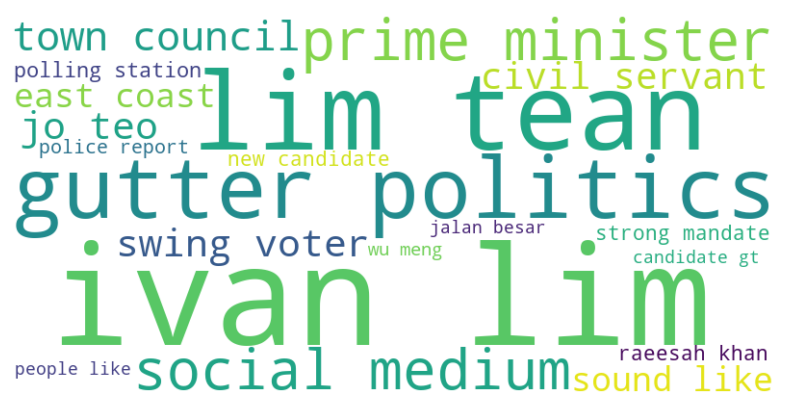

In [67]:
generate_keyword_wordcloud(docs=pap_jun_jul_2020, ngram_range=(2, 2), top_n=15, diversity=0.8)

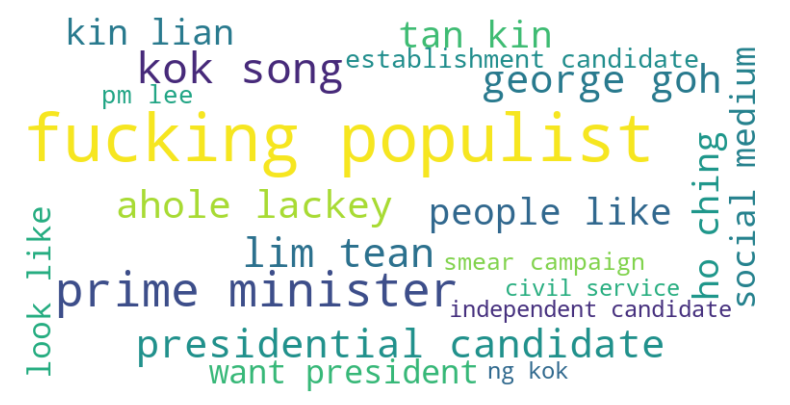

In [68]:
generate_keyword_wordcloud(docs=pap_jul_sep_2023, ngram_range=(2, 2), top_n=15, diversity=0.8)

## racist racism race chinese

In [151]:
racist_topic = 9
hate_toxic_frequency_by_topic(racist_topic)

1. **June-July 2020**: The global impact of the BLM protests, which were sparked by the killing of George Floyd in the United States in May 2020, reached many countries, including Singapore. Discussions on race and systemic racism were prominent on social media worldwide, and Singaporeans may have engaged in similar discussions on local forums. This often leads to heightened tensions and polarizing views about racism, particularly when applied to local contexts.

2. **June 2021**: In mid-2021, Singapore experienced several high-profile incidents involving racial tensions. For example:
   - There were incidents of publicized racist behavior, including a viral incident where a Chinese man confronted an interracial couple, which sparked widespread discussion on racial prejudices within Singapore.
   - Another incident involved a woman accusing a man of racism in a public park, which also went viral on social media and led to widespread debate.

   These incidents led to both official and public responses. Government figures and community leaders spoke out against racism, and there were campaigns promoting racial harmony. However, the public discourse was also heated, with individuals expressing strong, often divisive views about racism in Singapore. The increased frequency and visibility of such incidents likely fueled online discussions about race, with some comments becoming toxic as people debated Singapore’s racial policies, social integration, and personal experiences with racism.

### Diving Deeper

In [107]:
additional_words = {"singapore", "singaporean", "http", "gon", "na"}

# Prepare data for specific periods
racist_jun_jul_2020 = prepare_document(
    topic_number=racist_topic,
    start_date="2020-06-01",
    end_date="2020-08-01",
    topics_overview=final_topics_overview,
    additional_words=additional_words
)
racist_may_jul_2021 = prepare_document(
    topic_number=racist_topic,
    start_date="2023-05-01",
    end_date="2023-08-01",
    topics_overview=final_topics_overview,
    additional_words=additional_words
)
racist_jun_2021 = prepare_document(
    topic_number=racist_topic,
    start_date="2023-06-05",
    end_date="2023-07-01",
    topics_overview=final_topics_overview,
    additional_words=additional_words
)

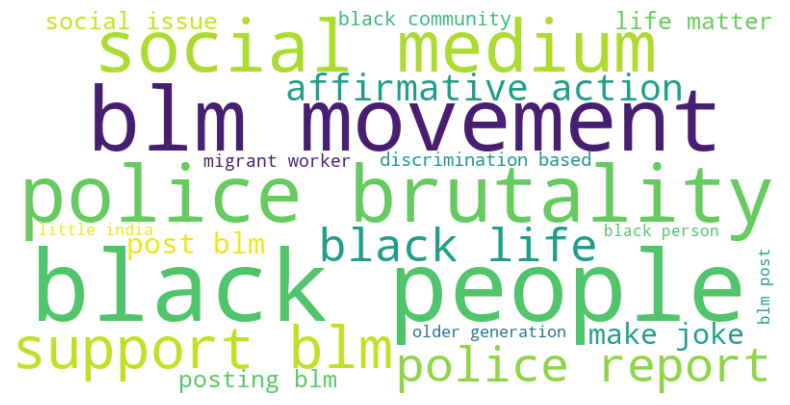

In [72]:
generate_keyword_wordcloud(docs=racist_jun_jul_2020, ngram_range=(2, 2), top_n=15, diversity=0.8)

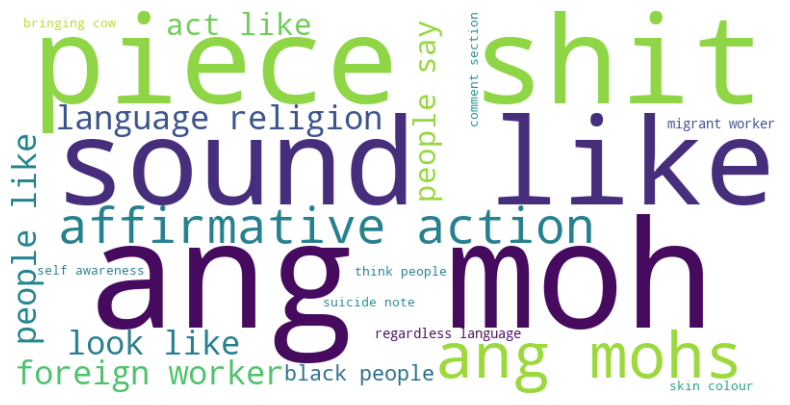

In [73]:
generate_keyword_wordcloud(docs=racist_may_jul_2021, ngram_range=(2, 2), top_n=15, diversity=0.8)

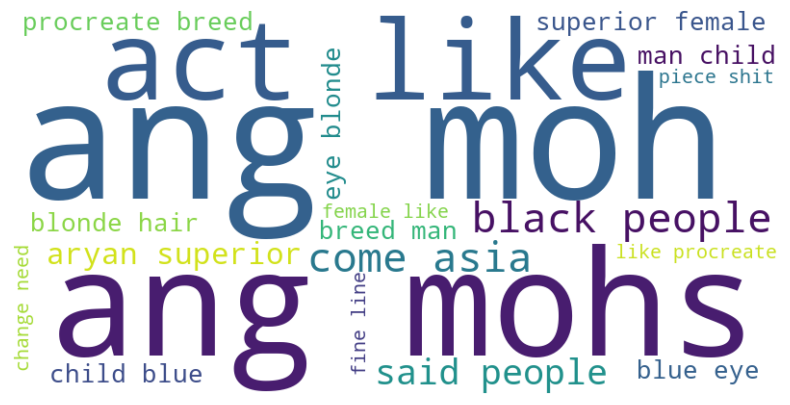

In [108]:
generate_keyword_wordcloud(docs=racist_jun_2021, ngram_range=(2, 2), top_n=15, diversity=0.8)

## scam bank scammers app

In [ ]:
scam_topic = 8
hate_toxic_frequency_by_topic(scam_topic)

1. **Increasing Trend**: Reports from Singapore's police showed a 40% increase in scams from 2020 to 2022. Common scams include phishing, e-commerce fraud, and job scams, contributing to sustained public concern. [Source: Singapore Police Force Annual Crime Brief] Furthermore, regular advisories from the Monetary Authority of Singapore (MAS) and banks educate the public about scams, which may lead to more online discussions as users share experiences and frustrations. [Source: MAS Public Advisory Reports]

2. **January 2022**: Over $8.5 million was lost by customers in a massive OCBC phishing scam, sparking public outrage and extensive media coverage. This event triggered discussions on social media about banks’ responsibilities and fraud prevention measures. [Source: Straits Times, Jan 2022] There was public backlash about OCBC's response and subsequent reimbursements were highly scrutinized, leading to an uptick in discussions around bank accountability. [Source: Channel NewsAsia, Jan 2022]

3. **August 2023**: By mid-2023, scams began incorporating AI-driven tactics, including voice phishing and app-based malware. Reports highlighted this new wave, raising public awareness and fueling discussions online. [Source: Cyber Security Agency of Singapore, Aug 2023] There was also a rise in digital banking app scams, often through fake apps or trojans, became a major concern, as reported by banks and cybersecurity advisories. [Source: GovTech, Aug 2023]

In response to the scam incidents, Singapore's financial institutions and banks released a detailed report on their fraud prevention measures, highlighting the importance of maintaining strong security measures and conducting regular audits. This report was widely covered on social media and led to public discussions on the importance of fraud prevention and the need for stronger regulations. [Source: Channel News Asia, Aug 2022]

### Diving Deeper

In [78]:
additional_words = {"singapore", "singaporean", "http", "gon", "na", "gt"}

# Prepare data for specific periods
scam_jan_2022 = prepare_document(
    topic_number=scam_topic,
    start_date="2022-01-01",
    end_date="2022-02-01",
    topics_overview=final_topics_overview,
    additional_words=additional_words
)
scam_aug_2023 = prepare_document(
    topic_number=scam_topic,
    start_date="2023-08-01",
    end_date="2023-09-01",
    topics_overview=final_topics_overview,
    additional_words=additional_words
)

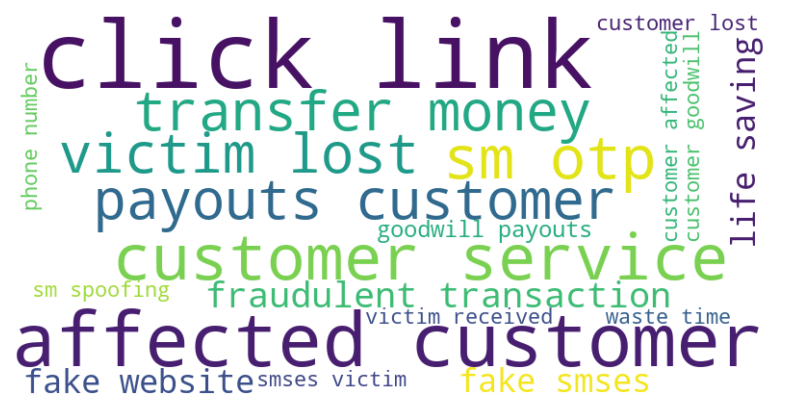

In [79]:
generate_keyword_wordcloud(docs=scam_jan_2022, ngram_range=(2, 2), top_n=15, diversity=0.8)

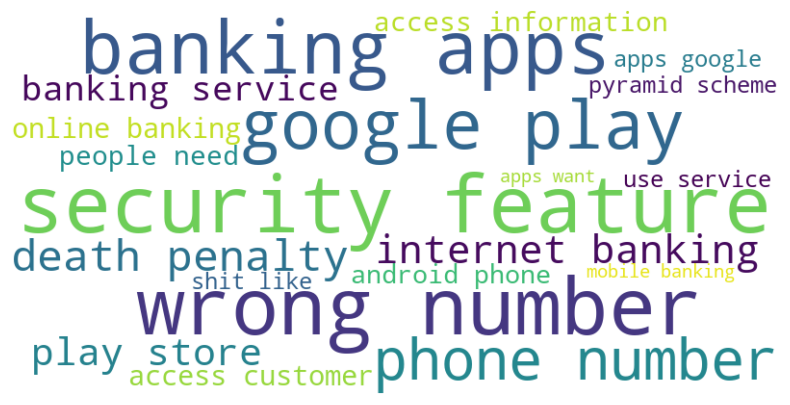

In [80]:
generate_keyword_wordcloud(docs=scam_aug_2023, ngram_range=(2, 2), top_n=15, diversity=0.8)

## drug drugs victim court

In [86]:
drug_topic = 2
hate_toxic_frequency_by_topic(drug_topic)

### Diving Deeper

In [89]:
additional_words = {"singapore", "singaporean", "http", "gon", "na", "gt"}

# Prepare data for specific periods
drug_apr_may_2022 = prepare_document(
    topic_number=drug_topic,
    start_date="2022-04-01",
    end_date="2022-06-01",
    topics_overview=final_topics_overview,
    additional_words=additional_words
)
drug_sep_2022 = prepare_document(
    topic_number=drug_topic,
    start_date="2022-09-01",
    end_date="2022-10-01",
    topics_overview=final_topics_overview,
    additional_words=additional_words
)

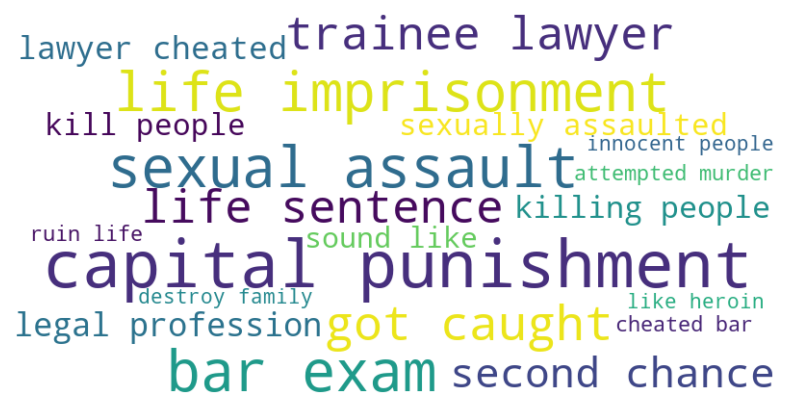

In [90]:
generate_keyword_wordcloud(docs=drug_apr_may_2022, ngram_range=(2, 2), top_n=15, diversity=0.8)

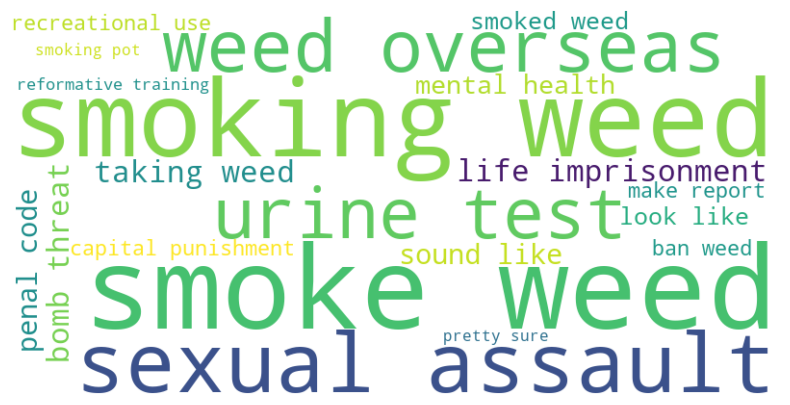

In [91]:
generate_keyword_wordcloud(docs=drug_sep_2022, ngram_range=(2, 2), top_n=15, diversity=0.8)

## cases covid 19 vaccine

In [ ]:
covid_topic = 5
hate_toxic_frequency_by_topic(covid_topic)

### Diving Deeper

In [ ]:
additional_words = {"singapore", "singaporean", "http", "gon", "na", "gt"}

# Prepare data for specific periods
covid_apr_2020 = prepare_document(
    topic_number=covid_topic,
    start_date="2020-04-01",
    end_date="2020-05-01",
    topics_overview=final_topics_overview,
    additional_words=additional_words
)
covid_jul_oct_2021 = prepare_document(
    topic_number=covid_topic,
    start_date="2021-07-01",
    end_date="2021-11-01",
    topics_overview=final_topics_overview,
    additional_words=additional_words
)

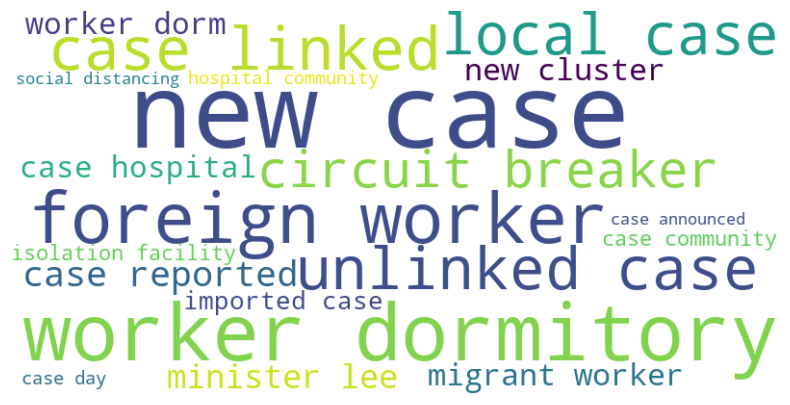

In [93]:
generate_keyword_wordcloud(docs=covid_apr_2020, ngram_range=(2, 2), top_n=15, diversity=0.8)

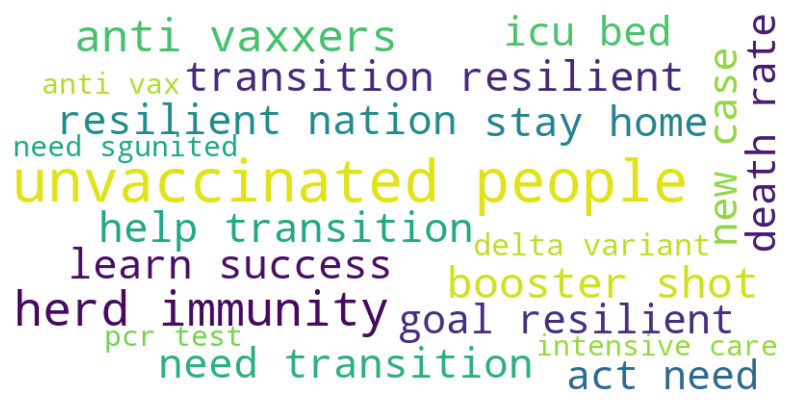

In [ ]:
generate_keyword_wordcloud(docs=covid_jul_oct_2021, ngram_range=(2, 2), top_n=15, diversity=0.8)

## road car cyclists driver

In [88]:
road_topic = 6
hate_toxic_frequency_by_topic(road_topic)

### Diving Deeper

In [95]:
additional_words = {"singapore", "singaporean", "http", "gon", "na", "gt"}

# Prepare data for specific periods
road_jun_jul_2023 = prepare_document(
    topic_number=road_topic,
    start_date="2023-06-01",
    end_date="2023-08-01",
    topics_overview=final_topics_overview,
    additional_words=additional_words
)

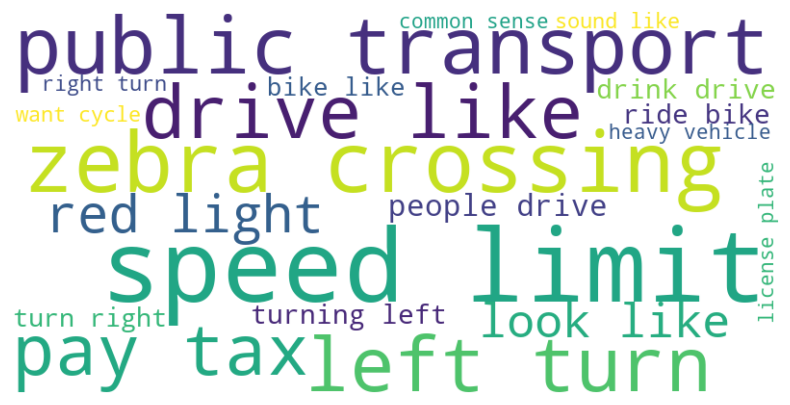

In [96]:
generate_keyword_wordcloud(docs=road_jun_jul_2023, ngram_range=(2, 2), top_n=15, diversity=0.8)